# <span style='color:SteelBlue'>P7 - Implémentez un modèle de scoring</span>

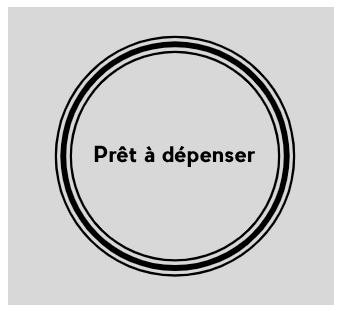

 # <span class='bg-primary'>P7_01_04 - FEATURES SELECTION</span>

Ce notebook traite de la 'feature sélection' des jeux de données des dataframes **train_set** et **test_set** composés des pré-processing (nettoyage, feature engineering)/aggrégations de tous les fichiers mis à notre disposition:

- **bureau.csv**,
- **bureau_balance.csv**,
- **credit_card_balance.csv**,
- **installments_payments.csv**,
- **POS_CASH_balance.csv**,
- **previous_application.csv**

En particulier :

- **Feature selection** : outre la génération de caractéristiques importantes/utiles, il est également essentiel de supprimer les caractéristiques redondantes et bruyantes. Si nous introduisons des déchets/bruits dans notre modèle d'apprentissage automatique, il retournera des déchets/bruits. Nous devons donc trouver de bonnes techniques de sélection des caractéristiques les plus importantes et discriminantes pour notre problématique.

***
Sources
***
Kernel Kaggle sur Home Credit :
- Feature sélection avec Lightgbm : [Source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
- Feature sélection avec BORUTA : [Source](https://www.kaggle.com/rsmits/feature-selection-with-boruta).
- Feature sélection avec BOOSTAROOTA : [Source](https://github.com/Murfin/nn_project/blob/master/NN%20project%20notebook%20ver.%202.ipynb)

## <span style='background:Thistle'>Sommaire du notebook</span> 

## <span style='background:Thistle'>1. Introduction</span>

*****
**Mission**
*****
**Développer un modèle de scoring de la probabilité de défaut de paiement du client** pour étayer la décision d'accorder ou non un prêt à un client potentiel en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières...).

*****
**Objectifs**
*****
- analyser le jeu de données,
- Construire **un modèle de scoring** qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique,
- réaliser un **dashboard interactif** permettant aux chargés de clientèles d'expliquer de manière transparente la décision d'octroi ou non de crédit

*****
**Sources**
*****
- [Jeu de données](https://www.kaggle.com/c/home-credit-default-risk/data)

Le **Kernel Kaggle** utilisé pour l'analyse exploratoire ayant l'EDA le plus de commentaires et effectuant une analyse exploratoire complète sur toutes les fichiers csv mis à notre disposition a été livré par **Rishabh Rao** (Student at -Jaipur, Rajasthan, India).
- [Kernel Kaggle Rishabh Rao](https://www.kaggle.com/rishabhrao/home-credit-default-risk-extensive-eda)

Ce travail est complété par l'auteur par une présentation sur le site medium.com :
[Explications](https://medium.com/thecyphy/home-credit-default-risk-part-1-3bfe3c7ddd7a)

Les fonctions python utilisées pour l'EDA sont extraites du [github](https://github.com/rishabhrao1997/Home-Credit-Default-Risk) et stockées dans la librairie *EDA_KERNEL_FONCTIONS.py*.

In [1]:
#!pip3 install numpy --upgrade

# Chargement des librairies
import eli5
import datetime
import sys
import time
from datetime import datetime
import warnings
import numpy as np
import pandas as pd
import os
import pickle

import EDA_kernel_kaggle
import tools_dataframe
import tools_preprocessing
import tools_feat_engineering


import matplotlib.pyplot as plt

# Modelisation
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Features selection
#from boruta import BorutaPy
#from BorutaShap import BorutaShap
from collections import Counter

# Warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Lightgbm              : ' + lgb.__version__)

now = datetime.now().isoformat()
print('Lancé le           : ' + now)

2023-06-30 15:35:32.184697: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-30 15:35:32.221004: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-30 15:35:32.221546: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-30 15:35:32.795711: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Version des librairies utilisées :
Python                : 3.9.13 (main, Aug 25 2022, 23:26:10) 
[GCC 11.2.0]
NumPy                 : 1.23.5
Pandas                : 1.5.3
Lightgbm              : 3.3.5
Lancé le           : 2023-06-30T15:35:33.715007


In [2]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 4,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>2. Chargement des jeux de données</span>

**Chargement des dataframes nettoyés**

In [3]:
# Load de datasets after feature engineering
path_train_dataset_after_feat_eng = '../P7_scoring_credit/preprocessing/final_train_data.pkl'

with open(path_train_dataset_after_feat_eng, 'rb') as f:
    train_set = pickle.load(f)

2:80: E501 line too long (93 > 79 characters)


In [4]:
# Load de datasets after feature engineering
path_test_dataset_after_feat_eng = '../P7_scoring_credit/preprocessing/final_test_data.pkl'

with open(path_test_dataset_after_feat_eng, 'rb') as f:
    test_set = pickle.load(f)

2:80: E501 line too long (91 > 79 characters)


## <span style='background:Thistle'>3. Features selection</span> 

### <span style='background:PowderBlue'>3.1. Features selection : avec LIGHTGBM</span>

- Extrait du Kernel Kaggle : [Source](https://www.kaggle.com/willkoehrsen/introduction-to-feature-selection)
- Le but est de conserver uniquement les variables les plus pertinentes en utilisant les features importance déterminée par un modèle, Lightgbm dans notre cas.

<span style='background:Moccasin'>**Train_set/test_set**</span>

- La variable magique TARGET_NEIGHBORS_500_MEAN peut être controverser par un client sur le recueil des données des autres clients et difficile à expliquer facilement à un client donc nous allons tester avec ou sans cette variable.

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation des dataframes de travail**

In [5]:
# Dataframes de travail
train_sans_fs_lgbm = train_set.copy()
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                             axis=1)
print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
test_sans_fs_lgbm = test_set.copy()
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(['TARGET_NEIGHBORS_500_MEAN'],
                                           axis=1)
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_sans_fs_lgbm : (307511, 635)
test_sans_fs_lgbm : (48744, 634)


In [6]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_sans_fs_lgbm_labels = train_sans_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_sans_fs_lgbm_ids = train_sans_fs_lgbm['SK_ID_CURR']
test_sans_fs_lgbm_ids = test_sans_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_sans_fs_lgbm, test_sans_fs_lgbm = \
    train_sans_fs_lgbm.align(test_sans_fs_lgbm, join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_sans_fs_lgbm.shape}')

train_fs_lgbm : (307511, 633)
test_fs_lgbm : (48744, 633)


**Modélisation**

***Premier passage***

In [ ]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances_sans = np.zeros(train_sans_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [ ]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_sans_features, valid_sans_features, train_sans_y, valid_sans_y = \
        train_test_split(train_sans_fs_lgbm, train_sans_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_sans_features, train_sans_y,
              early_stopping_rounds=100,
              eval_set=[(valid_sans_features, valid_sans_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances_sans += model.feature_importances_

In [ ]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances_sans = feature_importances_sans / 2
df_fs_sans_lightgbm = \
    pd.DataFrame({'feature': list(train_sans_fs_lgbm.columns),
                  'importance': feature_importances_sans}) \
    .sort_values('importance', ascending=False)

df_fs_sans_lightgbm.head()

In [ ]:
# Exploration des variables avec zéro importance
zero_features_sans = \
    list(df_fs_sans_lightgbm[df_fs_sans_lightgbm['importance'] == 0.0][
        'feature'])
print(f'{len(zero_features_sans)} variables avec 0.0 importance :\n')
zero_features_sans

In [ ]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_sans_lightgbm_norm = \
    EDA_kernel_kaggle.plot_feature_importances(df_fs_sans_lightgbm)

In [ ]:
# Suppression des variables avec zéro importance
train_sans_fs_lgbm = train_sans_fs_lgbm.drop(columns=zero_features_sans)
test_sans_fs_lgbm = test_sans_fs_lgbm.drop(columns=zero_features_sans)

print(f'train_sans_fs_lgbm : {train_sans_fs_lgbm.shape}')
print(f'test_sans_fs_lgbm : {test_sans_fs_lgbm.shape}')

***Second passage***

In [ ]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2_sans, df_fs_sans_lightgbm_2 = EDA_kernel_kaggle \
    .identify_zero_importance_features(train_sans_fs_lgbm,
                                       train_sans_fs_lgbm_labels)

**Sauvegarde**

In [20]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_sans_lightgbm = \
    '../P7_scoring_credit/preprocessing/fs_sans_lightgbm.pickle'

In [ ]:
# Sauvegarde des features importances avec lightgbm
with open(fic_sav_fs_sans_lightgbm, 'wb') as f:
    pickle.dump(df_fs_sans_lightgbm_2, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [22]:
# Chargement des features importance de ligthgbm
with open(fic_sav_fs_sans_lightgbm, 'rb') as df_fs_sans_lightgbm:
    df_fs_sans_lightgbm = pickle.load(df_fs_sans_lightgbm)
df_fs_sans_lightgbm.shape

(485, 2)

In [23]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = pd.DataFrame({})
df_fs_sans_train_set = \
    tools_feat_engineering.tracer_features_importance(df_fs_sans_lightgbm,
                                                    df_fs_sans_train_set,
                                                    'train_sans_set',
                                                    'lightgbm')

5:53: E128 continuation line under-indented for visual indent
6:53: E128 continuation line under-indented for visual indent
7:53: E128 continuation line under-indented for visual indent


<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation des dataframes de travail**

In [10]:
# Dataframes de travail
train_fs_lgbm = train_set.copy()
print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
test_fs_lgbm = test_set.copy()
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307511, 636)
test_fs_lgbm : (48744, 635)


In [11]:
# Sauvegarde des étiquettes car l'alignement supprimera
# cette variable.
train_fs_lgbm_labels = train_fs_lgbm['TARGET']

# Sauvegarde des identifiants
train_fs_lgbm_ids = train_fs_lgbm['SK_ID_CURR']
test_fs_lgbm_ids = test_fs_lgbm['SK_ID_CURR']

# Alignement des dataframes (suppression variable TARGET)
train_fs_lgbm, test_fs_lgbm = train_fs_lgbm.align(test_fs_lgbm,
                                                  join='inner', axis=1)

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_lgbm = train_fs_lgbm.drop(columns=['SK_ID_CURR'])
test_fs_lgbm = test_fs_lgbm.drop(columns=['SK_ID_CURR'])

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307511, 634)
test_fs_lgbm : (48744, 634)


**Modélisation**

***Premier passage***

In [19]:
# Initialiser un tableau vide pour contenir les features importance
feature_importances = np.zeros(train_fs_lgbm.shape[1])

# Create the model with several hyperparameters
model = lgb.LGBMClassifier(objective='binary',
                           boosting_type='goss',
                           n_estimators=10000,
                           class_weight='balanced')

In [20]:
# Entraînement du modèle deux fois pour éviter l'overfitting
for i in range(2):

    # Split en jeux d'entraînement et de validation
    train_features, valid_features, train_y, valid_y = \
        train_test_split(train_fs_lgbm, train_fs_lgbm_labels,
                         test_size=0.25, random_state=i)

    # Entraînement en utilisant early stopping
    model.fit(train_features, train_y,
              early_stopping_rounds=100,
              eval_set=[(valid_features, valid_y)],
              eval_metric='auc', verbose=200)

    # Sauvegarde des features importances
    feature_importances += model.feature_importances_

[200]	valid_0's auc: 0.800853	valid_0's binary_logloss: 0.49067
[200]	valid_0's auc: 0.802051	valid_0's binary_logloss: 0.489485


In [21]:
# Assurez-vous de faire la moyenne des features importance !
# puisque le modèle a été entraîné 2 fois
feature_importances = feature_importances / 2
df_fs_lightgbm = \
    pd.DataFrame({'feature': list(train_fs_lgbm.columns),
                  'importance': feature_importances}) \
    .sort_values('importance', ascending=False)

df_fs_lightgbm.head()

,feature,importance
78,TARGET_NEIGHBORS_500_MEAN,147.0
192,REGIONS_RATING_INCOME_MUL_0,145.5
7,DAYS_BIRTH,70.0
70,EXT_SOURCE_MEAN,64.0
447,CNT_INSTALMENT_FUTURE_MIN_MEAN,56.0


In [22]:
# Exploration des variables avec zéro importance
# Find the features with zero importance
zero_features = \
    list(df_fs_lightgbm[df_fs_lightgbm['importance'] == 0.0]['feature'])
print(f'{len(zero_features)} variables avec 0.0 importance :\n')
zero_features

141 variables avec 0.0 importance :



['CREDIT_TYPE_Mobile operator loan_MEAN_OVERALL',
 'CREDIT_TYPE_Loan for business development_MEAN_OVERALL',
 'CURRENT_AMT_OVERDUE_DURATION_RATIO_MEAN_OVERALL',
 'AMT_OVERDUE_DURATION_LEFT_RATIO_MEAN_OVERALL',
 'CNT_PROLONGED_DURATION_RATIO_MEAN_OVERALL',
 'CREDIT_ENDDATE_UPDATE_DIFF_MEAN_OVERALL',
 'BALANCE_LIMIT_RATIO_MAX_COMPLETED',
 'CURRENCY_currency 1_MEAN_OVERALL',
 'CURRENCY_currency 3_MEAN_OVERALL',
 'CURRENCY_currency 4_MEAN_OVERALL',
 'CNT_DRAWING_SUM_SUM_COMPLETED',
 'CREDIT_ACTIVE_Bad debt_MEAN_OVERALL',
 'CREDIT_TYPE_Unknown type of loan_MEAN_OVERALL',
 'CREDIT_TYPE_Cash loan (non-earmarked)_MEAN_OVERALL',
 'CREDIT_TYPE_Interbank credit_MEAN_OVERALL',
 'MIN_PAYMENT_RATIO_MIN_COMPLETED',
 'EXP_AMT_DRAWING_SUM_LAST_REST',
 'AMT_INTEREST_RECEIVABLE_MEAN_COMPLETED',
 'SK_DPD_RATIO_MAX_REST',
 'AMT_INTEREST_RECEIVABLE_MIN_COMPLETED',
 'MIN_PAYMENT_RATIO_MIN_REST',
 'CREDIT_TYPE_Real estate loan_MEAN_OVERALL',
 'CREDIT_TYPE_Loan for working capital replenishment_MEAN_OVERALL',


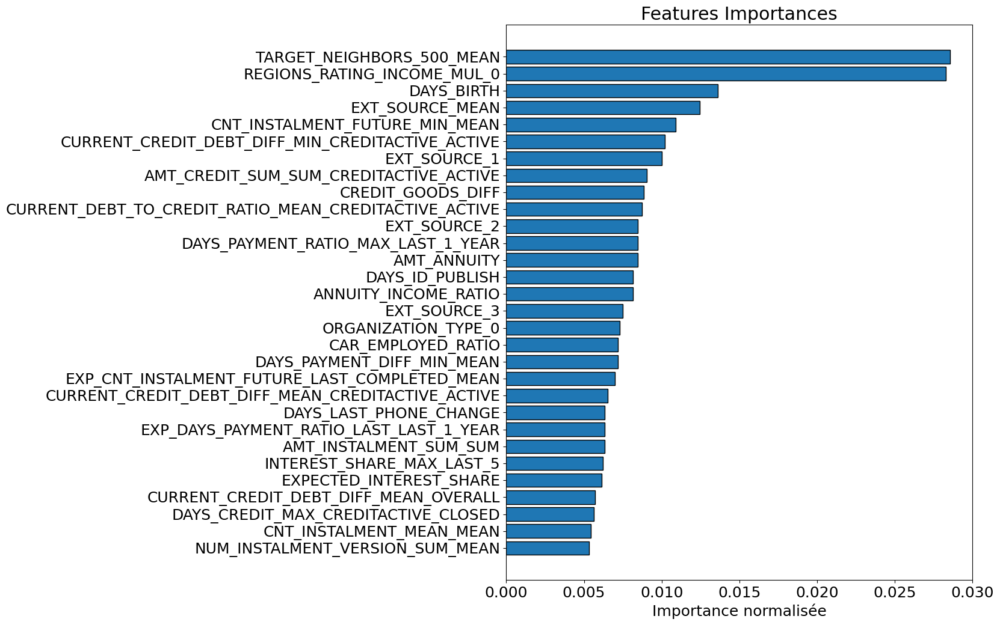

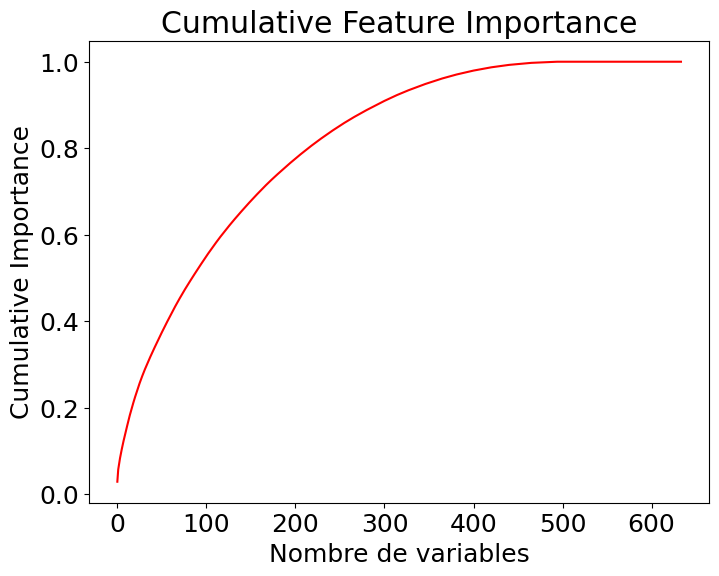

293 variables nécessaires pour 0.90 de cumulative importance


In [23]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm = \
    EDA_kernel_kaggle.plot_feature_importances(df_fs_lightgbm)

In [24]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307511, 493)
test_fs_lgbm : (48744, 493)


***Second passage***

In [25]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_2, df_fs_lightgbm_2 = EDA_kernel_kaggle \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.800857	valid_0's binary_logloss: 0.490721
[200]	valid_0's auc: 0.801966	valid_0's binary_logloss: 0.489916

There are 8 features with 0.0 importance


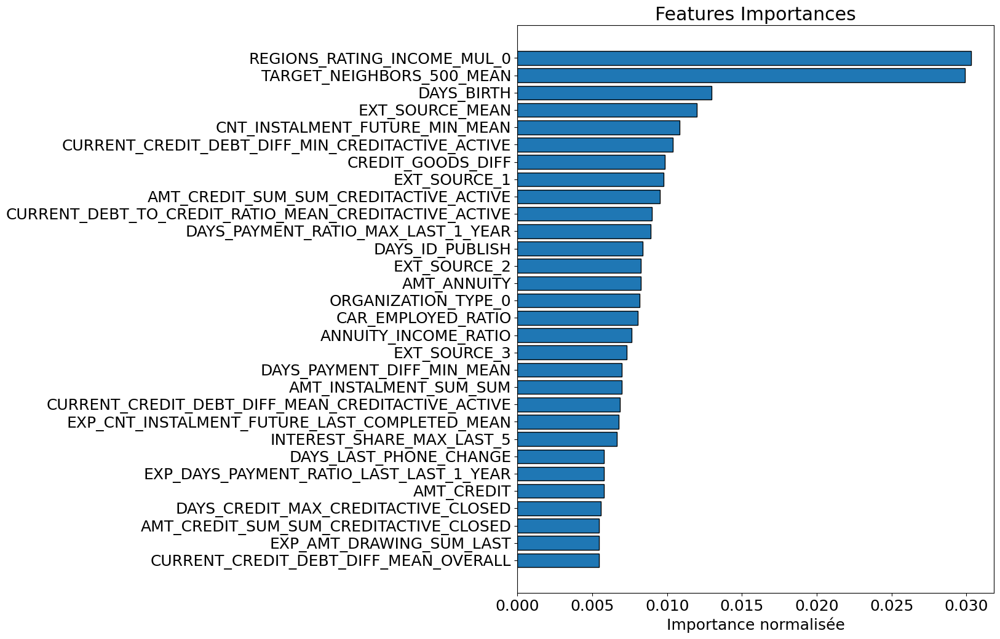

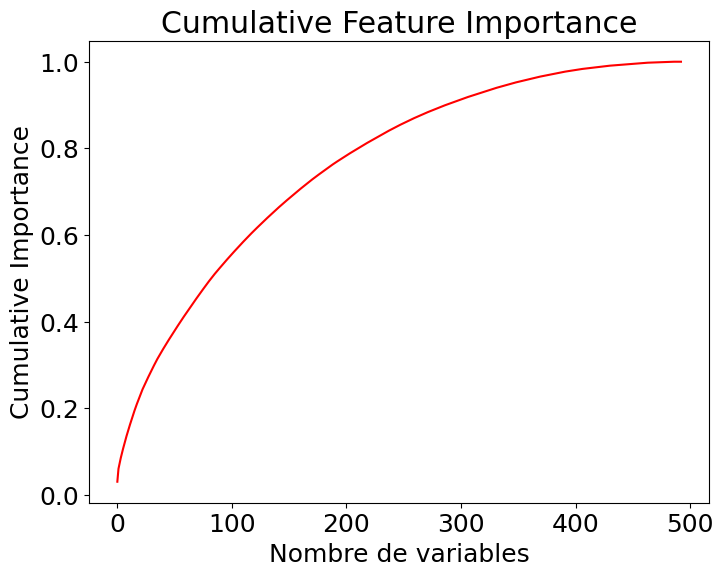

288 variables nécessaires pour 0.90 de cumulative importance


In [26]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_2 = \
    EDA_kernel_kaggle.plot_feature_importances(df_fs_lightgbm_2)

In [27]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features_2)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features_2)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307511, 485)
test_fs_lgbm : (48744, 485)


***Troisième passage***

In [28]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_3, df_fs_lightgbm_3 = EDA_kernel_kaggle \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.800851	valid_0's binary_logloss: 0.49032
[200]	valid_0's auc: 0.801673	valid_0's binary_logloss: 0.490018

There are 0 features with 0.0 importance


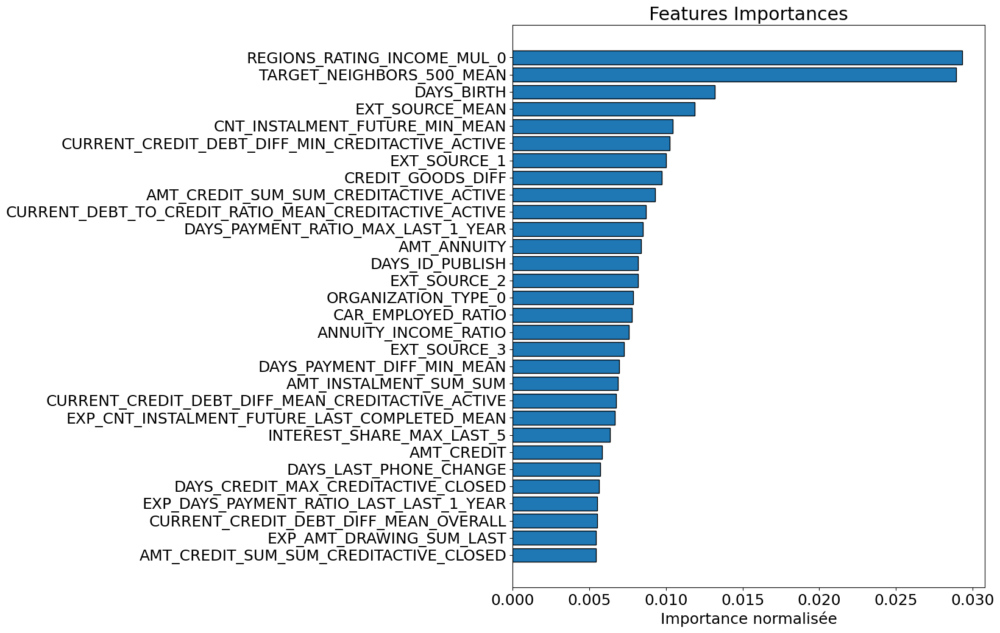

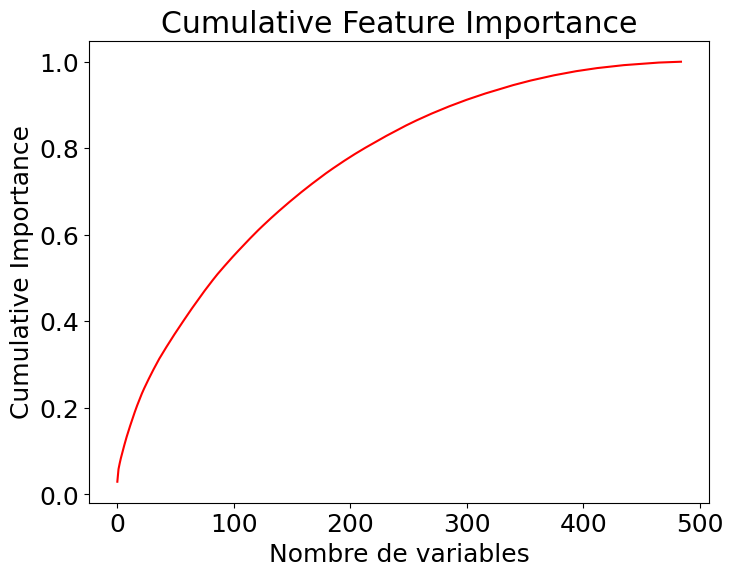

290 variables nécessaires pour 0.90 de cumulative importance


In [29]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_3 = \
    EDA_kernel_kaggle.plot_feature_importances(df_fs_lightgbm_3)

In [30]:
# Suppression des variables avec zéro importance
train_fs_lgbm = train_fs_lgbm.drop(columns=zero_features_3)
test_fs_lgbm = test_fs_lgbm.drop(columns=zero_features_3)

print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307511, 485)
test_fs_lgbm : (48744, 485)


***Quatrième passage***

In [31]:
# Repasser une fois le modèle pour voir si lightgbm retrouve des 0 importance
zero_features_4, df_fs_lightgbm_4 = EDA_kernel_kaggle \
    .identify_zero_importance_features(train_fs_lgbm,
                                       train_fs_lgbm_labels)

[200]	valid_0's auc: 0.800851	valid_0's binary_logloss: 0.49032
[200]	valid_0's auc: 0.801673	valid_0's binary_logloss: 0.490018

There are 0 features with 0.0 importance


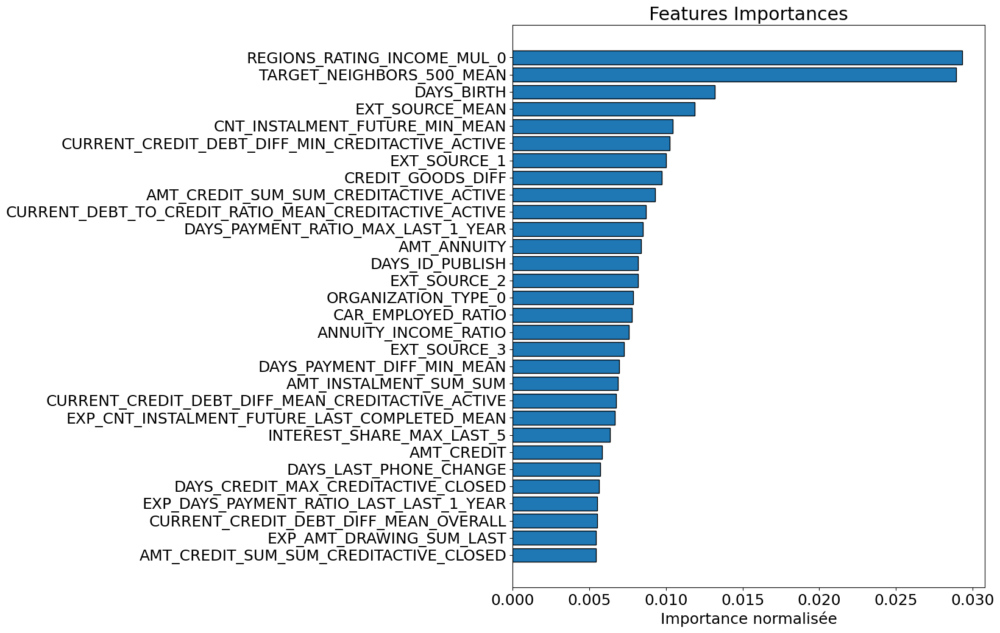

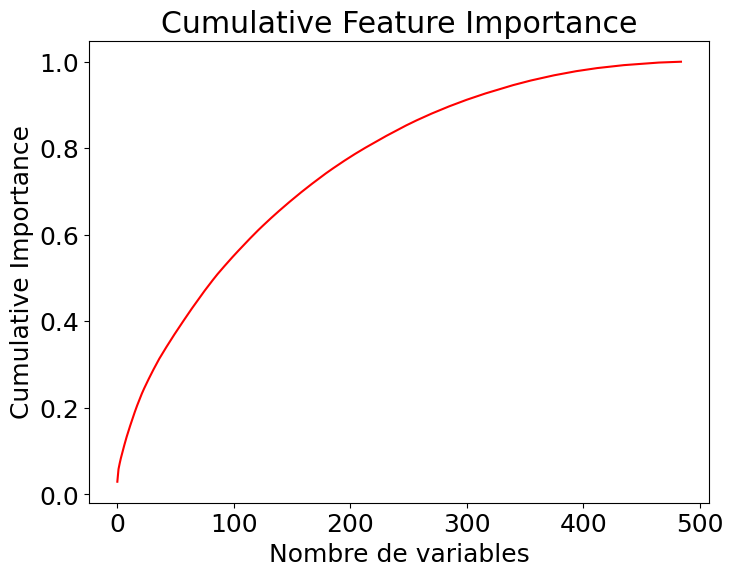

290 variables nécessaires pour 0.90 de cumulative importance


In [32]:
# Affichage des variables les plus importantes normalisées déterminée
# par Lightgbm
df_fs_lightgbm_norm_4 = \
    EDA_kernel_kaggle.plot_feature_importances(df_fs_lightgbm_4)

**Reconstitution des dataframes**

In [12]:
train_fs_lgbm['TARGET'] = train_fs_lgbm_labels
train_fs_lgbm['SK_ID_CURR'] = train_fs_lgbm_ids
print(f'train_fs_lgbm : {train_fs_lgbm.shape}')
test_fs_lgbm['SK_ID_CURR'] = test_fs_lgbm_ids
print(f'test_fs_lgbm : {test_fs_lgbm.shape}')

train_fs_lgbm : (307511, 636)
test_fs_lgbm : (48744, 635)


**Sauvegarde**

In [24]:
# Sauvegarde des features importances avec lightgbm
fic_sav_fs_lightgbm = \
    '../P7_scoring_credit/preprocessing/fs_lightgbm.pickle'

In [35]:
# Sauvegarde des features importances avec lightgbm

with open(fic_sav_fs_lightgbm, 'wb') as f:
    pickle.dump(df_fs_lightgbm_4, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [25]:
# Chargement des features importance de ligthgbm

with open(fic_sav_fs_lightgbm, 'rb') as f:
    df_fs_lightgbm = pickle.load(f)

df_fs_lightgbm.shape

(485, 2)

In [26]:
# Sauvegarde du nombre de features importance
df_fs_train_set = pd.DataFrame({})
df_fs_train_set = \
    tools_feat_engineering.tracer_features_importance(df_fs_lightgbm,
                                                    df_fs_train_set,
                                                    'train_set',
                                                    'lightgbm')

5:53: E128 continuation line under-indented for visual indent
6:53: E128 continuation line under-indented for visual indent
7:53: E128 continuation line under-indented for visual indent


### <span style='background:PowderBlue'>3.2. Features selection : avec BORUTA</span>

- Extrait du Kernel Kaggle de Robert Smith : [Source](https://www.kaggle.com/rsmits/feature-selection-with-boruta)

Boruta, comme RFE, est une technique de sélection de caractéristiques basée sur des enveloppes. Elle est moins connue mais tout aussi puissante. L'idée derrière Boruta est très simple. Étant donné un ensemble de données tabulaires, nous ajustons itérativement un algorithme supervisé (généralement un modèle basé sur un arbre) sur une version étendue des données. La version étendue, à chaque itération, est composée des données d'origine avec, attachée horizontalement, une copie des colonnes mélangées. Nous ne conservons que les caractéristiques qui, dans chaque itération :
ont une plus grande importance que la meilleure des caractéristiques mélangées ;
sont meilleures que prévu par rapport au hasard (en utilisant une distribution binomiale).

- Boruta : [Source](https://towardsdatascience.com/boruta-explained-the-way-i-wish-someone-explained-it-to-me-4489d70e154a) [Source](https://towardsdatascience.com/boruta-and-shap-for-better-feature-selection-20ea97595f4a) [Source](https://blog.exploratory.io/finding-variable-importance-with-random-forest-boruta-28badd116197) [Source](https://towardsdatascience.com/simple-example-using-boruta-feature-selection-in-python-8b96925d5d7a)

<span style='background:Moccasin'>**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

***Avec model RandomForestClassifier***

**Préparation du dataframe de travail**

### <span style='background:PowderBlue'>3.3. Features selection : avec BORUTASHAP</span>

- Librairie : [Source](https://pypi.org/project/BorutaShap/)
- La librairie BorutaShap, comme son nom l'indique, combine l'algorithme de sélection de caractéristiques Boruta avec la technique SHAP (SHapley Additive exPlanations).
- L'algorithme Boruta (du nom d'un dieu de la forêt dans la mythologie slave) a pour tâche de trouver un ensemble de caractéristiques optimal minimal plutôt que de trouver toutes les caractéristiques pertinentes pour la variable cible. 
- Cela conduit à une sélection non biaisée et stable des attributs importants et non importants. 
- La librairie BorutaShap a été écrit par Eoghan Keany, qui a également écrit un article d'introduction "Is this the Best Feature Selection Algorithm 'BorutaShap' ?" fournissant une vue d'ensemble du fonctionnement de BorutaShap : [Source](https://medium.com/analytics-vidhya/is-this-the-best-feature-selection-algorithm-borutashap-8bc238aa1677) - [Source](https://github.com/Ekeany/Boruta-Shap).

### <span style='background:PowderBlue'>3.4. Features selection : avec permutation importance</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [16]:
# Dataframes de travail
train_fs_perm = train_set.copy()
print(f'train_fs_perm : {train_fs_perm.shape}')

train_fs_perm : (307511, 636)


In [17]:
# Sauvegarde des étiquettes
train_fs_perm_labels = train_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_fs_perm = train_fs_perm.drop(columns=['SK_ID_CURR'])
train_fs_perm = train_fs_perm.drop(columns=['TARGET'])

print(f'train_fs_perm : {train_fs_perm.shape}')

train_fs_perm : (307511, 634)


In [18]:
tools_dataframe.complet_description(train_fs_perm)

,Variable,Type,null,Duplicated,Filling percentage,count,mean,std,min,25%,50%,75%,max
0,DAYS_CREDIT_UPDATE_MEANCREDIT_ACTIVE_REST,float64,307511,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CREDIT_ENDDATE_UPDATE_DIFF_MEAN_OVERALL,float64,307511,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CREDIT_ENDDATE_UPDATE_DIFF_MAX_CREDITACTIVE_CLOSED,float64,307511,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CREDIT_ENDDATE_UPDATE_DIFF_MIN_CREDITACTIVE_CLOSED,float64,307511,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,DAYS_ENDDATE_FACT_MEAN_CREDITACTIVE_ACTIVE,float64,307511,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
629,WEIGHTED_STATUS_MEAN_MEAN_OVERALL,float16,0,297513,100.0,307511.0,0.0,0.1473,0.0,0.168,0.168,0.168,4.0
630,WEIGHTED_STATUS_FIRST_MEAN_OVERALL,float16,0,301041,100.0,307511.0,0.0,0.1078,0.0,0.0934,0.0934,0.0934,4.0
631,STATUS_MEAN_YEAR_REST_MEAN_OVERALL,float16,0,302976,100.0,307511.0,NaN,0.0,0.0,1.0059,1.0059,1.0059,6.6797
632,AMT_ANNUITY_MEAN_OVERALL,float32,0,266919,100.0,307511.0,8997.167,87038.7031,0.0,6516.0,6516.0,6516.0,27282428.0


In [19]:
empty_columns = []
for col in train_fs_perm.columns:
    if len(train_fs_perm[col].unique()) <= 1:
        empty_columns.append(col)

print(f"There are {len(empty_columns)} columns with just 1 unique value")
print("Removing these from dataset")
train_fs_perm = train_fs_perm.drop(empty_columns, axis=1)

There are 45 columns with just 1 unique value
Removing these from dataset


In [20]:
# Initialisation des variables
X = train_fs_perm
y = train_fs_perm_labels

In [21]:
# Split en jeux d'entraînement et de validation
X_train, X_test, y_train, y_test = \
    train_test_split(X, y, test_size=0.25, random_state=21)

In [44]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

# Entraînement en utilisant early stopping
lgbm.fit(X_train, y_train,
         early_stopping_rounds=100,
         eval_set=[(X_test, y_test)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.799549	valid_0's binary_logloss: 0.491985


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

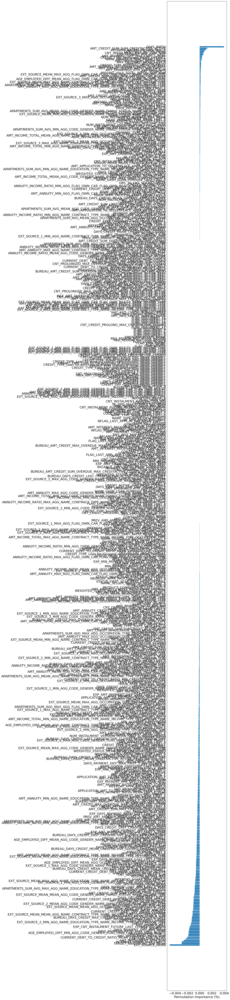

In [45]:
# Feature importance par permutation importance avec sklearn
perm_imp_sklearn = tools_feat_engineering \
    .plot_permutation_importance(lgbm, X_test, y_test, figsize=(6, 100))

In [46]:
# Constitution du dataframe de travail
df_fs_perm_imp_sklearn = \
    pd.DataFrame({'Variables': X_test.columns,
                  'Importance': perm_imp_sklearn.importances_mean,
                  'Importance_abs': np.abs(perm_imp_sklearn.importances_mean)})

In [47]:
# Variables sans zéros importances
fs_perm_imp_sklearn = df_fs_perm_imp_sklearn[df_fs_perm_imp_sklearn[
    'Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sklearn.shape[0]} variables sans zéro importance')

446 variables sans zéro importance


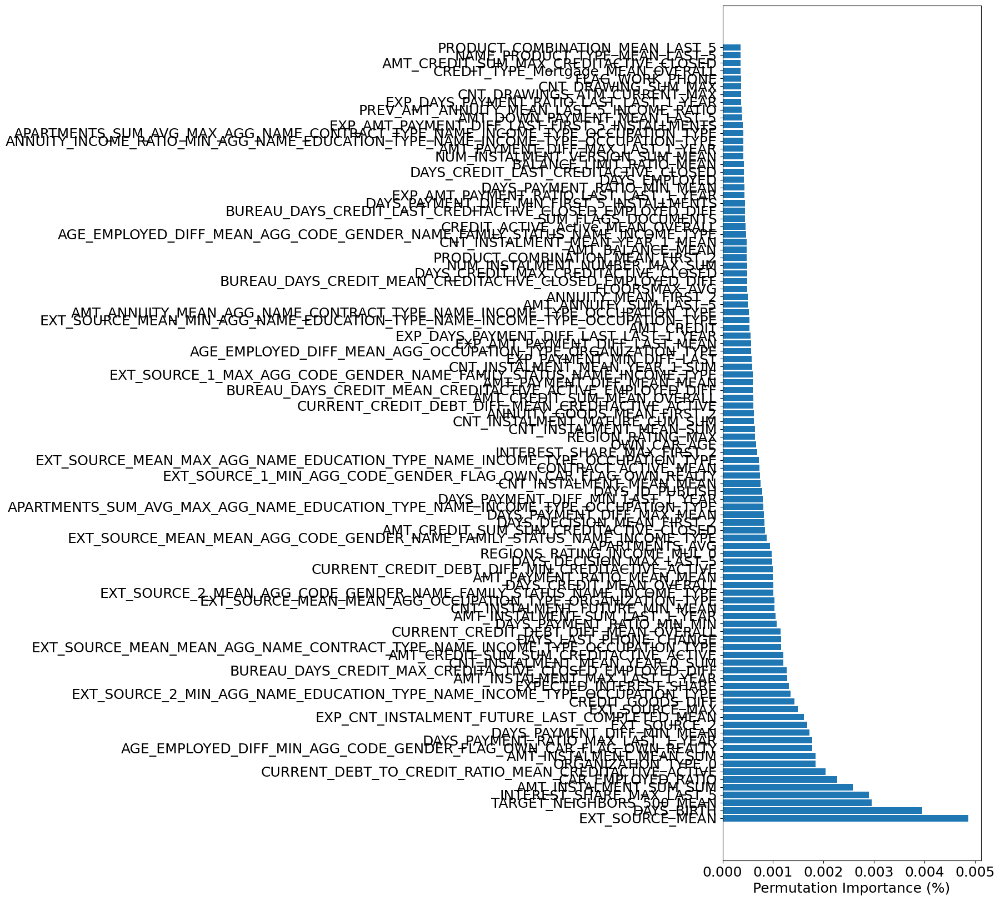

In [48]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sklearn_plot = \
    df_fs_perm_imp_sklearn.sort_values(by='Importance_abs',
                                       ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sklearn_plot['Variables'].head(100),
         df_fs_perm_imp_sklearn_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [49]:
df_fs_perm_imp_sklearn = pd.DataFrame(fs_perm_imp_sklearn['Variables'])
df_fs_perm_imp_sklearn.shape[0]

446

**Sauvegarde**

In [50]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sklearn_lgbm = \
    '../P7_scoring_credit/preprocessing/perm_imp_sklearn.pickle'
with open(fic_sav_perm_imp_sklearn_lgbm, 'wb') as f:
    pickle.dump(perm_imp_sklearn, f, pickle.HIGHEST_PROTOCOL)

In [27]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sklearn_lgbm = \
    '../P7_scoring_credit/preprocessing/fs_perm_imp_sklearn.pickle'

In [51]:
# Sauvegarde des features importances avec permutation importance sklearn
with open(fic_sav_fs_perm_imp_sklearn_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sklearn, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [28]:
# Chargement des features importance de sklearn perm imp

# Chargement des features importance
with open(fic_sav_fs_perm_imp_sklearn_lgbm, 'rb') as df_fs_perm_imp_sklearn:
    df_fs_perm_imp_sklearn = pickle.load(df_fs_perm_imp_sklearn)
df_fs_perm_imp_sklearn.shape

(446, 1)

In [29]:
# Sauvegarde du nombre de features importance
df_fs_train_set = tools_feat_engineering.tracer_features_importance(df_fs_perm_imp_sklearn,
                                df_fs_train_set,
                                'train_set',
                                'permutation-importance-LightGbm')

2:80: E501 line too long (91 > 79 characters)
3:33: E128 continuation line under-indented for visual indent
4:33: E128 continuation line under-indented for visual indent
5:33: E128 continuation line under-indented for visual indent


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [54]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_eli5 = \
    tools_feat_engineering.plot_permutation_importance_eli5(lgbm, X_test,
                                                          y_test)

Weight,Feature
0.0037 ± 0.0009,DAYS_BIRTH
0.0012 ± 0.0009,REGIONS_RATING_INCOME_MUL_0
0.0011 ± 0.0006,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE
0.0008 ± 0.0007,CONTRACT_ACTIVE_MEAN
0.0006 ± 0.0003,EXP_PAYMENT_MIN_DIFF_LAST
0.0005 ± 0.0002,CREDIT_TYPE_Mortgage_MEAN_OVERALL
0.0005 ± 0.0004,CNT_INSTALMENT_MATURE_CUM_SUM
0.0004 ± 0.0002,NAME_PRODUCT_TYPE_MEAN_LAST_5
0.0004 ± 0.0001,AMT_PAYMENT_DIFF_MAX_LAST_1_YEAR
0.0003 ± 0.0001,AMT_INSTALMENT_MEAN_MEAN


4:59: E128 continuation line under-indented for visual indent


In [55]:
# Constitution du dataframe de travail
df_fs_perm_imp_eli5 = \
    pd.DataFrame({'Variables': X_test.columns,
                  'Importance': perm_imp_eli5.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_eli5.feature_importances_)})

In [56]:
# Variables sans zéros importances
fs_perm_imp_eli5 = df_fs_perm_imp_eli5[df_fs_perm_imp_eli5[
    'Importance_abs'] != 0.0000]
print(f'{fs_perm_imp_eli5.shape[0]} variables sans zéro importance')

443 variables sans zéro importance


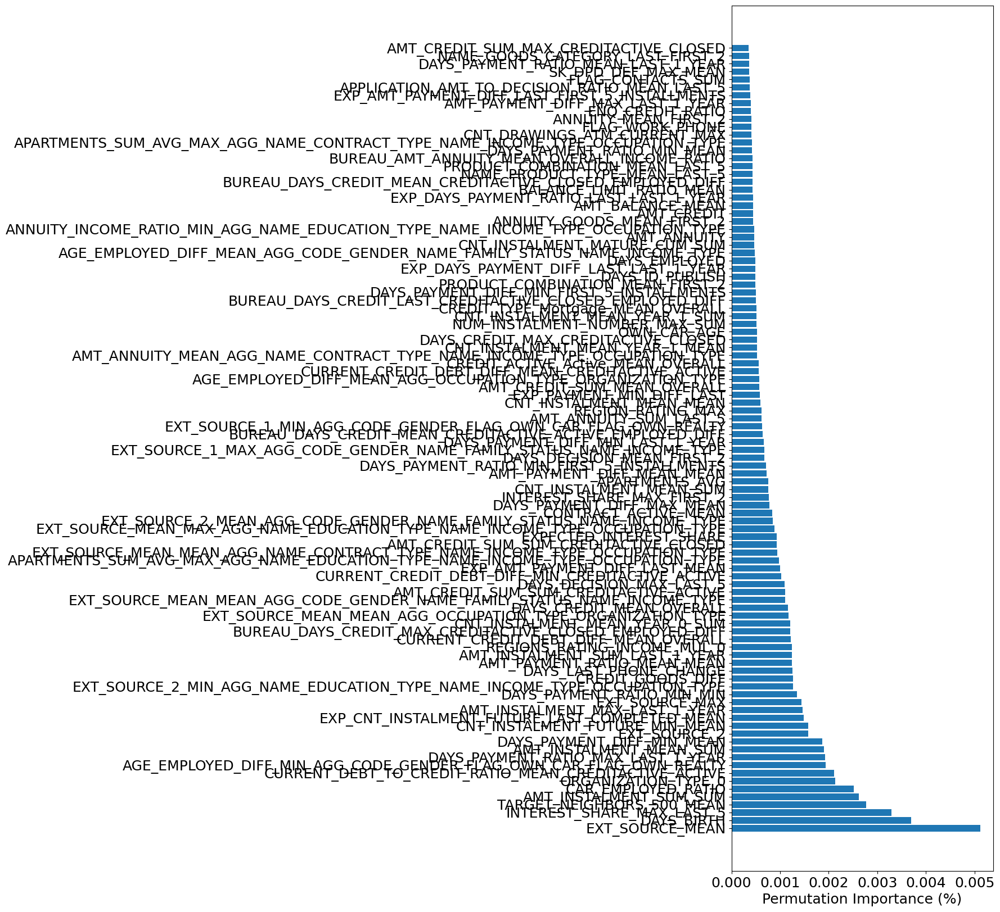

In [57]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_eli5_plot = \
    df_fs_perm_imp_eli5.sort_values(by='Importance_abs',
                                    ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_eli5_plot['Variables'].head(100),
         df_fs_perm_imp_eli5_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [58]:
df_fs_perm_imp_eli5 = pd.DataFrame(fs_perm_imp_eli5['Variables'])
df_fs_perm_imp_eli5.shape[0]

443

**Sauvegarde**

In [30]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_eli5_lgbm = \
    '../P7_scoring_credit/preprocessing/fs_perm_imp_eli5.pickle'

In [59]:
# Sauvegarde des features importances avec permutation importance eli5

with open(fic_sav_fs_perm_imp_eli5_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_eli5, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [31]:
# Chargement des features importance de eli5

# Chargement des features importance
with open(fic_sav_fs_perm_imp_eli5_lgbm, 'rb') as df_fs_perm_imp_eli5:
    df_fs_perm_imp_eli5 = pickle.load(df_fs_perm_imp_eli5)
df_fs_perm_imp_eli5.shape

(443, 1)

In [32]:
# Sauvegarde du nombre de features importance
df_fs_train_set = tools_feat_engineering.tracer_features_importance(df_fs_perm_imp_eli5,
                                df_fs_train_set,
                                'train_set',
                                'permutation-importance-eli5')

2:80: E501 line too long (88 > 79 characters)
3:33: E128 continuation line under-indented for visual indent
4:33: E128 continuation line under-indented for visual indent
5:33: E128 continuation line under-indented for visual indent


<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

**Préparation du dataframe de travail**

In [28]:
# Dataframes de travail
train_sans_fs_perm = train_set.copy()
train_sans_fs_perm = \
    train_sans_fs_perm.drop(['TARGET_NEIGHBORS_500_MEAN'], axis=1)
print(f'train_sans_fs_perm : {train_sans_fs_perm.shape}')

train_sans_fs_perm : (307511, 635)


In [29]:
# Sauvegarde des étiquettes
train_sans_fs_perm_labels = train_sans_fs_perm['TARGET']

# Suppression des identifiants (variable non utile pour les variables
# pertinentes)
train_sans_fs_perm = train_sans_fs_perm.drop(columns=['SK_ID_CURR'])
train_sans_fs_perm = train_sans_fs_perm.drop(columns=['TARGET'])

print(f'train_sans_fs_perm : {train_sans_fs_perm.shape}')

train_sans_fs_perm : (307511, 633)


In [30]:
# Initialisation des variables
X = train_sans_fs_perm
y = train_sans_fs_perm_labels

In [8]:
# Create the model with several hyperparameters
lgbm = lgb.LGBMClassifier(objective='binary',
                          boosting_type='goss',
                          n_estimators=10000,
                          class_weight='balanced')

In [40]:
# Split en jeux d'entraînement et de validation
X_train_sans, X_test_sans, y_train_sans, y_test_sans = \
    train_test_split(X, y, test_size=0.25, random_state=21)

In [9]:
# Entraînement en utilisant early stopping
lgbm.fit(X_train_sans, y_train_sans,
         early_stopping_rounds=100,
         eval_set=[(X_test_sans, y_test_sans)],
         eval_metric='auc', verbose=200)

[200]	valid_0's auc: 0.793941	valid_0's binary_logloss: 0.496128


LGBMClassifier(boosting_type='goss', class_weight='balanced',
               n_estimators=10000, objective='binary')

<span style='background:Plum'>**Permutation-based Importance avec sklearn**</span>

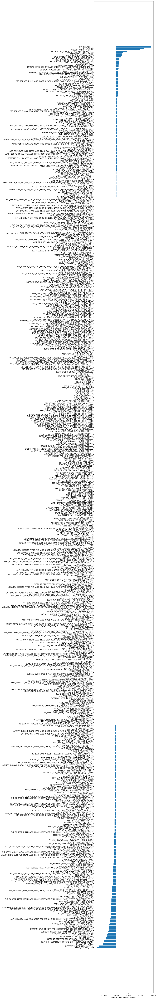

In [10]:
# Feature importance par permutation importance avec sklearn
perm_imp_sans_sklearn = tools_feat_engineering \
    .plot_permutation_importance(lgbm, X_test_sans, y_test_sans,
                                 figsize=(6, 100))

In [11]:
# Constitution du dataframe de travail
df_fs_perm_imp_sans_sklearn = \
    pd.DataFrame({'Variables': X_test_sans.columns,
                  'Importance': perm_imp_sans_sklearn.importances_mean,
                  'Importance_abs':
                      np.abs(perm_imp_sans_sklearn.importances_mean)})

In [12]:
# Variables sans zéros importances
fs_perm_imp_sans_sklearn = df_fs_perm_imp_sans_sklearn[
    df_fs_perm_imp_sans_sklearn['Importance_abs'] != 0.000]
print(f'{fs_perm_imp_sans_sklearn.shape[0]} variables sans zéro importance')

456 variables sans zéro importance


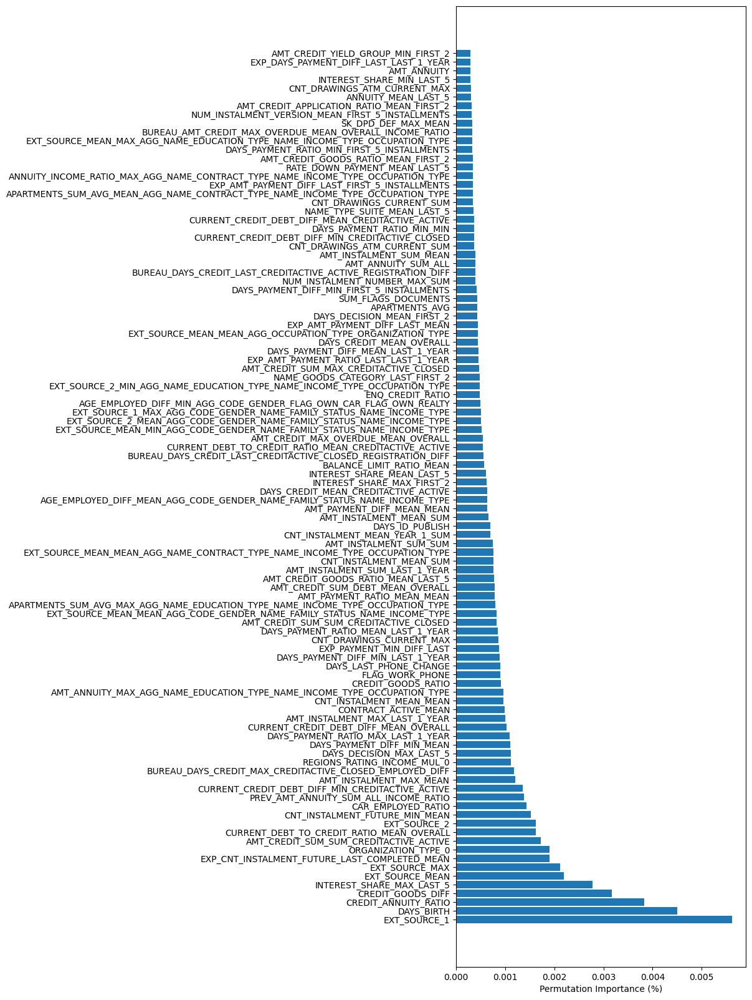

In [13]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sans_sklearn_plot = \
    df_fs_perm_imp_sans_sklearn.sort_values(by='Importance_abs',
                                            ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sans_sklearn_plot['Variables'].head(100),
         df_fs_perm_imp_sans_sklearn_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [14]:
df_fs_perm_imp_sans_sklearn = \
    pd.DataFrame(fs_perm_imp_sans_sklearn['Variables'])
df_fs_perm_imp_sans_sklearn.shape[0]

456

**Sauvegarde**

In [15]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_perm_imp_sans_sklearn_lgbm = \
    '../P7_scoring_credit/preprocessing/perm_imp_sans_sklearn.pickle'
with open(fic_sav_perm_imp_sans_sklearn_lgbm, 'wb') as f:
    pickle.dump(perm_imp_sans_sklearn, f, pickle.HIGHEST_PROTOCOL)

In [33]:
# Sauvegarde des features importances avec permutation importance sklearn
fic_sav_fs_perm_imp_sans_sklearn_lgbm = \
    '../P7_scoring_credit/preprocessing/fs_perm_imp_sans_sklearn.pickle'

In [16]:
# Sauvegarde des features importances avec permutation importance sklearn

with open(fic_sav_fs_perm_imp_sans_sklearn_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sans_sklearn, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [34]:
# Chargement des features importance de sklearn perm imp

# Chargement des features importance
with open(fic_sav_fs_perm_imp_sans_sklearn_lgbm, 'rb') as df_fs_perm_imp_ss_sklearn:
    df_fs_perm_imp_sans_sklearn = pickle.load(df_fs_perm_imp_ss_sklearn)
df_fs_perm_imp_sans_sklearn.shape

(456, 1)

4:80: E501 line too long (84 > 79 characters)


In [35]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = tools_feat_engineering.tracer_features_importance(df_fs_perm_imp_sans_sklearn,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'permutation-importance-LightGbm')

2:80: E501 line too long (101 > 79 characters)
3:33: E128 continuation line under-indented for visual indent
4:33: E128 continuation line under-indented for visual indent
5:33: E128 continuation line under-indented for visual indent


<span style='background:Plum'>**Permutation importance avec eli5**</span>

In [42]:
# Feature importance par permutation importance avec avec librairie eli5
perm_imp_sans_eli5 = \
    tools_feat_engineering.plot_permutation_importance_eli5(lgbm,
                                                          X_test_sans,
                                                          y_test_sans)

Weight,Feature
0.0057 ± 0.0004,EXT_SOURCE_1
0.0043 ± 0.0002,DAYS_BIRTH
0.0038 ± 0.0010,CREDIT_ANNUITY_RATIO
0.0015 ± 0.0006,AMT_CREDIT_SUM_SUM_CREDITACTIVE_ACTIVE
0.0014 ± 0.0003,REGIONS_RATING_INCOME_MUL_0
0.0010 ± 0.0004,EXP_PAYMENT_MIN_DIFF_LAST
0.0010 ± 0.0002,CONTRACT_ACTIVE_MEAN
0.0008 ± 0.0002,DAYS_PAYMENT_RATIO_MEAN_LAST_1_YEAR
0.0005 ± 0.0001,AMT_CREDIT_MAX_OVERDUE_MEAN_OVERALL
0.0005 ± 0.0004,NAME_GOODS_CATEGORY_LAST_FIRST_2


4:59: E128 continuation line under-indented for visual indent
5:59: E128 continuation line under-indented for visual indent


In [43]:
# Constitution du dataframe de travail
df_fs_perm_imp_sans_eli5 = \
    pd.DataFrame({'Variables': X_test_sans.columns,
                  'Importance': perm_imp_sans_eli5.feature_importances_,
                  'Importance_abs':
                  np.abs(perm_imp_sans_eli5.feature_importances_)})

In [44]:
# Variables sans zéros importances
df_fs_perm_imp_sans_eli5 = df_fs_perm_imp_sans_eli5[
    df_fs_perm_imp_sans_eli5['Importance_abs'] != 0.0000]
print(f'{df_fs_perm_imp_sans_eli5.shape[0]} variables sans zéro importance')

458 variables sans zéro importance


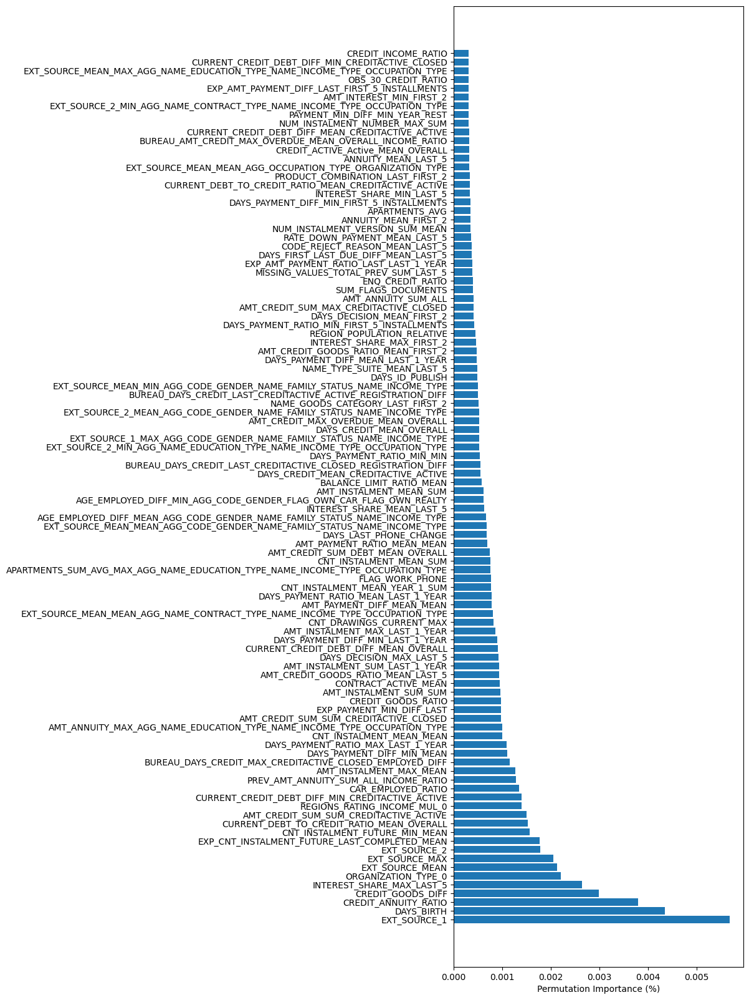

In [45]:
# Affichage des 100 variables les plus importantes
df_fs_perm_imp_sans_eli5_plot = \
    df_fs_perm_imp_sans_eli5.sort_values(by='Importance_abs',
                                         ascending=False)

plt.figure(figsize=(6, 20))
plt.barh(df_fs_perm_imp_sans_eli5_plot['Variables'].head(100),
         df_fs_perm_imp_sans_eli5_plot['Importance_abs'].head(100))
plt.xlabel("Permutation Importance (%)")
plt.show()

In [46]:
df_fs_perm_imp_sans_eli5 = pd.DataFrame(df_fs_perm_imp_sans_eli5['Variables'])
df_fs_perm_imp_sans_eli5.shape[0]

458

**Sauvegarde**

In [36]:
# Sauvegarde des features importances avec permutation importance eli5
fic_sav_fs_perm_imp_sans_eli5_lgbm = \
    '../P7_scoring_credit/preprocessing/fs_perm_imp_sans_eli5.pickle'

In [47]:
# Sauvegarde des features importances avec permutation importance eli5

with open(fic_sav_fs_perm_imp_sans_eli5_lgbm, 'wb') as f:
    pickle.dump(df_fs_perm_imp_sans_eli5, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [37]:
# Chargement des features importance de eli5

with open(fic_sav_fs_perm_imp_sans_eli5_lgbm, 'rb') as df_fs_perm_imp_sans_eli5:
    df_fs_perm_imp_sans_eli5 = pickle.load(df_fs_perm_imp_sans_eli5)
df_fs_perm_imp_sans_eli5.shape

(458, 1)

3:80: E501 line too long (80 > 79 characters)


In [38]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = tools_feat_engineering.tracer_features_importance(df_fs_perm_imp_sans_eli5,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'permutation-importance-eli5')

2:80: E501 line too long (98 > 79 characters)
3:33: E128 continuation line under-indented for visual indent
4:33: E128 continuation line under-indented for visual indent
5:33: E128 continuation line under-indented for visual indent


### <span style='background:PowderBlue'>3.5. Features selection : RFECV</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

In [36]:
# Estimateur de RFECV
estimator = lgb.LGBMClassifier(random_state=21)

In [37]:
fs_rfecv_train_set = \
    tools_feat_engineering.calcul_plot_rfecv(estimator, X_train, y_train,
                                           figsize=(8, 50))

KeyboardInterrupt: 

3:44: E128 continuation line under-indented for visual indent


In [ ]:
fs_rfecv = ['NAME_CONTRACT_TYPE',
            'CODE_GENDER',
            'FLAG_OWN_CAR',
            'AMT_INCOME_TOTAL',
            'AMT_CREDIT',
            'AMT_ANNUITY',
            'REGION_POPULATION_RELATIVE',
            'DAYS_BIRTH',
            'DAYS_EMPLOYED',
            'DAYS_REGISTRATION',
            'DAYS_ID_PUBLISH',
            'OWN_CAR_AGE',
            'FLAG_WORK_PHONE',
            'REGION_RATING_CLIENT',
            'HOUR_APPR_PROCESS_START',
            'REG_CITY_NOT_LIVE_CITY',
            'EXT_SOURCE_1',
            'EXT_SOURCE_2',
            'EXT_SOURCE_3',
            'APARTMENTS_AVG',
            'BASEMENTAREA_AVG',
            'YEARS_BEGINEXPLUATATION_AVG',
            'YEARS_BUILD_AVG',
            'ENTRANCES_AVG',
            'FLOORSMAX_AVG',
            'LANDAREA_AVG',
            'OBS_30_CNT_SOCIAL_CIRCLE',
            'DEF_30_CNT_SOCIAL_CIRCLE',
            'DAYS_LAST_PHONE_CHANGE',
            'FLAG_DOCUMENT_8',
            'CREDIT_INCOME_RATIO',
            'CREDIT_ANNUITY_RATIO',
            'ANNUITY_INCOME_RATIO',
            'CREDIT_GOODS_RATIO',
            'INCOME_GOODS_DIFF',
            'INCOME_EXT_RATIO',
            'LAST_PHONE_EMPLOYED_RATIO',
            'CAR_EMPLOYED_RATIO',
            'EXT_SOURCE_SUM',
            'EXT_SOURCE_MAX',
            'EXT_SOURCE_VAR',
            'OBS_DEF_30_MUL',
            'OBS_30_CREDIT_RATIO',
            'FLAGS_DOCUMENTS_SUM',
            'ENQ_CREDIT_RATIO',
            'TARGET_NEIGHBORS_500_MEAN',
            'NAME_INCOME_TYPE_WORKING',
            'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
            'NAME_EDUCATION_TYPE_INCOMPLETE_HIGHER',
            'NAME_FAMILY_STATUS_MARRIED',
            'OCCUPATION_TYPE_CORE_STAFF',
            'OCCUPATION_TYPE_DRIVERS',
            'OCCUPATION_TYPE_SALES_STAFF',
            'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_3',
            'ORGANIZATION_TYPE_CONSTRUCTION',
            'ORGANIZATION_TYPE_MILITARY',
            'ORGANIZATION_TYPE_SELF_EMPLOYED',
            'ORGANIZATION_TYPE_TRANSPORT_TYPE_3',
            'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
            'CCB_AMT_BALANCE_MEAN',
            'CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM',
            'CCB_AMT_DRAWINGS_OTHER_CURRENT_SUM',
            'CCB_AMT_DRAWINGS_POS_CURRENT_SUM',
            'CCB_AMT_PAYMENT_CURRENT_MEAN',
            'CCB_AMT_PAYMENT_CURRENT_MAX',
            'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
            'CCB_CNT_DRAWINGS_CURRENT_SUM',
            'CCB_SK_DPD_SUM',
            'CCB_BALANCE_LIMIT_RATIO_MEAN',
            'CCB_BALANCE_LIMIT_RATIO_MIN',
            'CCB_CNT_DRAWING_SUM_MAX',
            'CCB_MIN_PAYMENT_RATIO_MEAN',
            'CCB_PAYMENT_MIN_DIFF_MIN',
            'CCB_AMT_INTEREST_RECEIVABLE_MIN',
            'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
            'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
            'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
            'INST_PAY_DAYS_INSTALMENT_MAX',
            'INST_PAY_DAYS_INSTALMENT_MIN',
            'INST_PAY_AMT_INSTALMENT_MEAN',
            'INST_PAY_AMT_INSTALMENT_SUM',
            'INST_PAY_AMT_INSTALMENT_MIN',
            'INST_PAY_AMT_INSTALMENT_MAX',
            'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
            'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
            'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
            'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
            'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
            'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
            'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
            'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
            'INST_PAY_AMT_PAYMENT_DIFF_MAX',
            'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
            'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
            'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_MEAN',
            'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_MEAN',
            'POS_CASH_CNT_INSTALMENT_MEAN',
            'POS_CASH_CNT_INSTALMENT_MIN',
            'POS_CASH_CNT_INSTALMENT_FUTURE_MIN',
            'POS_CASH_SK_DPD_MEAN',
            'POS_CASH_SK_DPD_DEF_MEAN',
            'POS_CASH_TOTAL_TERM_LAST',
            'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
            'PREV_APP_NAME_PAYMENT_TYPE_CASH_THROUGH_THE_BANK_MEAN',
            'PREV_APP_CODE_REJECT_REASON_HC_MEAN',
            'PREV_APP_CODE_REJECT_REASON_LIMIT_MEAN',
            'PREV_APP_CODE_REJECT_REASON_SCOFR_MEAN',
            'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_OTHER_A_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_OTHER_B_SUM',
            'PREV_APP_NAME_TYPE_SUITE_SPOUSE_PARTNER_MEAN',
            'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_MEAN',
            'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_MEAN',
            'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_MEAN',
            'PREV_APP_NAME_PORTFOLIO_XNA_MEAN',
            'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_MEAN',
            'PREV_APP_NAME_PRODUCT_TYPE_X_SELL_MEAN',
            'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__MEAN',
            'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_SUM',
            'PREV_APP_CHANNEL_TYPE_CREDIT_AND_CASH_OFFICES_MEAN',
            'PREV_APP_CHANNEL_TYPE_STONE_MEAN',
            'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_SUM',
            'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITH_INTEREST_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_MEAN',
            'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITHOUT_INTEREST_MEAN',
            'PREV_APP_AMT_ANNUITY_MEAN',
            'PREV_APP_AMT_ANNUITY_SUM',
            'PREV_APP_AMT_ANNUITY_MIN',
            'PREV_APP_AMT_APPLICATION_MEAN',
            'PREV_APP_AMT_APPLICATION_MIN',
            'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
            'PREV_APP_AMT_GOODS_PRICE_MIN',
            'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
            'PREV_APP_RATE_DOWN_PAYMENT_MEAN',
            'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
            'PREV_APP_DAYS_DECISION_MEAN',
            'PREV_APP_DAYS_DECISION_MAX',
            'PREV_APP_SELLERPLACE_AREA_MEAN',
            'PREV_APP_CNT_PAYMENT_MEAN',
            'PREV_APP_NAME_YIELD_GROUP_MEAN',
            'PREV_APP_DAYS_FIRST_DUE_SUM',
            'PREV_APP_DAYS_LAST_DUE_MAX',
            'PREV_APP_AMT_DECLINED_SUM',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
            'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN',
            'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
            'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN',
            'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
            'PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN',
            'PREV_APP_ANNUITY_MEAN',
            'PREV_APP_ANNUITY_GOODS_MEAN',
            'PREV_APP_LOAN_RATE_MAX',
            'PREV_APP_LOAN_RATE_MEAN',
            'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
            'PREV_APP_AMT_INTEREST_MEAN',
            'PREV_APP_INTEREST_SHARE_MEAN',
            'PREV_APP_INTEREST_SHARE_MAX',
            'PREV_APP_INTEREST_SHARE_MIN',
            'PREV_APP_INTEREST_RATE_MAX',
            'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
            'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN',
            'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
            'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
            'BUREAU_CREDIT_ACTIVE_SOLD_MEAN',
            'BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN',
            'BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN',
            'BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM',
            'BUREAU_CREDIT_TYPE_MICROLOAN_SUM',
            'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
            'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
            'BUREAU_DAYS_CREDIT_MEAN',
            'BUREAU_DAYS_CREDIT_MAX',
            'BUREAU_DAYS_CREDIT_LAST',
            'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
            'BUREAU_AMT_CREDIT_SUM_MEAN',
            'BUREAU_AMT_CREDIT_SUM_SUM',
            'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
            'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
            'BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN',
            'BUREAU_AMT_CREDIT_SUM_LIMIT_MAX',
            'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
            'BUREAU_AMT_CREDIT_SUM_OVERDUE_MAX',
            'BUREAU_AMT_ANNUITY_SUM',
            'BUREAU_AMT_ANNUITY_COUNT',
            'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
            'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN',
            'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
            'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN',
            'BUREAU_AMT_ANNUITY_CREDIT_RATIO_MEAN']

In [ ]:
df_fs_rfecv = pd.DataFrame(fs_rfecv)
df_fs_rfecv.shape[0]

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec RFECV
fic_sav_fs_rfecv = \
    '../P7_scoring_credit/preprocessing/fs_rfecv.pickle'
with open(fic_sav_fs_rfecv, 'wb') as f:
    pickle.dump(df_fs_rfecv, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [1]:
# Chargement des features importance de RFECV

with open(fic_sav_fs_rfecv, 'rb') as df_fs_rfecv:
    df_fs_rfecv = pickle.load(df_fs_rfecv)
df_fs_rfecv.shape

NameError: name 'fic_sav_fs_rfecv' is not defined

In [ ]:
# Sauvegarde du nombre de features importance
df_fs_train_set = tools_feat_engineering.tracer_features_importance(df_fs_rfecv,
                                df_fs_train_set,
                                'train_set',
                                'RFECV')

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

In [38]:
# Estimateur de RFECV
estimator_sans = lgb.LGBMClassifier(random_state=21)

In [41]:
fs_rfecv_sans_train_set = \
    tools_feat_engineering.calcul_plot_rfecv(estimator_sans,
                                           X_train_sans,
                                           y_train_sans,
                                           figsize=(8, 50))

KeyboardInterrupt: 

3:44: E128 continuation line under-indented for visual indent
4:44: E128 continuation line under-indented for visual indent
5:44: E128 continuation line under-indented for visual indent


In [ ]:
fs_rfecv_sans = [
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'REGION_RATING_CLIENT',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'NONLIVINGAREA_AVG',
 'EMERGENCYSTATE_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_21',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'CREDIT_INCOME_RATIO',
 'CREDIT_ANNUITY_RATIO',
 'ANNUITY_INCOME_RATIO',
 'CREDIT_GOODS_RATIO',
 'INCOME_GOODS_DIFF',
 'INCOME_EXT_RATIO',
 'LAST_PHONE_EMPLOYED_RATIO',
 'CAR_EMPLOYED_RATIO',
 'FLAG_CONTACTS_SUM',
 'CNT_NON_CHILDREN',
 'EXT_SOURCE_SUM',
 'EXT_SOURCE_MAX',
 'EXT_SOURCE_VAR',
 'OBS_DEF_30_MUL',
 'OBS_30_CREDIT_RATIO',
 'FLAGS_DOCUMENTS_SUM',
 'ENQ_CREDIT_RATIO',
 'NAME_TYPE_SUITE_CHILDREN',
 'NAME_TYPE_SUITE_OTHER_B',
 'NAME_INCOME_TYPE_BUSINESSMAN',
 'NAME_INCOME_TYPE_STATE_SERVANT',
 'NAME_INCOME_TYPE_WORKING',
 'NAME_EDUCATION_TYPE_HIGHER_EDUCATION',
 'NAME_EDUCATION_TYPE_INCOMPLETE_HIGHER',
 'NAME_FAMILY_STATUS_CIVIL_MARRIAGE',
 'NAME_FAMILY_STATUS_MARRIED',
 'NAME_FAMILY_STATUS_SEPARATED',
 'NAME_FAMILY_STATUS_SINGLE_NOT_MARRIED',
 'NAME_HOUSING_TYPE_HOUSE_APARTMENT',
 'OCCUPATION_TYPE_ACCOUNTANTS',
 'OCCUPATION_TYPE_CLEANING_STAFF',
 'OCCUPATION_TYPE_CORE_STAFF',
 'OCCUPATION_TYPE_DRIVERS',
 'OCCUPATION_TYPE_LOW_SKILL_LABORERS',
 'OCCUPATION_TYPE_MANAGERS',
 'OCCUPATION_TYPE_MEDICINE_STAFF',
 'OCCUPATION_TYPE_SALES_STAFF',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_WEDNESDAY',
 'ORGANIZATION_TYPE_BUSINESS_ENTITY_TYPE_3',
 'ORGANIZATION_TYPE_CONSTRUCTION',
 'ORGANIZATION_TYPE_CULTURE',
 'ORGANIZATION_TYPE_INDUSTRY_TYPE_7',
 'ORGANIZATION_TYPE_KINDERGARTEN',
 'ORGANIZATION_TYPE_MEDICINE',
 'ORGANIZATION_TYPE_MILITARY',
 'ORGANIZATION_TYPE_REALTOR',
 'ORGANIZATION_TYPE_SCHOOL',
 'ORGANIZATION_TYPE_SELF_EMPLOYED',
 'ORGANIZATION_TYPE_TRADE_TYPE_3',
 'ORGANIZATION_TYPE_TRANSPORT_TYPE_3',
 'HOUSETYPE_MODE_SPECIFIC_HOUSING',
 'WALLSMATERIAL_MODE_MIXED',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'CCB_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'CCB_AMT_BALANCE_SUM',
 'CCB_AMT_BALANCE_MEAN',
 'CCB_AMT_CREDIT_LIMIT_ACTUAL_SUM',
 'CCB_AMT_CREDIT_LIMIT_ACTUAL_MEAN',
 'CCB_AMT_DRAWINGS_ATM_CURRENT_SUM',
 'CCB_AMT_DRAWINGS_ATM_CURRENT_MAX',
 'CCB_AMT_DRAWINGS_POS_CURRENT_SUM',
 'CCB_AMT_INST_MIN_REGULARITY_MIN',
 'CCB_AMT_PAYMENT_CURRENT_MEAN',
 'CCB_AMT_PAYMENT_CURRENT_MIN',
 'CCB_AMT_PAYMENT_CURRENT_MAX',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MAX',
 'CCB_CNT_DRAWINGS_ATM_CURRENT_MEAN',
 'CCB_CNT_DRAWINGS_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_SUM',
 'CCB_CNT_DRAWINGS_OTHER_CURRENT_MAX',
 'CCB_SK_DPD_SUM',
 'CCB_SK_DPD_DEF_SUM',
 'CCB_BALANCE_LIMIT_RATIO_MEAN',
 'CCB_BALANCE_LIMIT_RATIO_MIN',
 'CCB_CNT_DRAWING_SUM_MAX',
 'CCB_MIN_PAYMENT_RATIO_MEAN',
 'CCB_PAYMENT_MIN_DIFF_MIN',
 'CCB_AMT_INTEREST_RECEIVABLE_MIN',
 'INST_PAY_NUM_INSTALMENT_VERSION_MEAN',
 'INST_PAY_NUM_INSTALMENT_VERSION_SUM',
 'INST_PAY_NUM_INSTALMENT_NUMBER_MAX',
 'INST_PAY_DAYS_INSTALMENT_MAX',
 'INST_PAY_DAYS_INSTALMENT_MIN',
 'INST_PAY_AMT_INSTALMENT_MEAN',
 'INST_PAY_AMT_INSTALMENT_SUM',
 'INST_PAY_AMT_INSTALMENT_MIN',
 'INST_PAY_AMT_INSTALMENT_MAX',
 'INST_PAY_DAYS_PAYMENT_RATIO_MEAN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MIN',
 'INST_PAY_DAYS_PAYMENT_RATIO_MAX',
 'INST_PAY_DAYS_PAYMENT_DIFF_MEAN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MIN',
 'INST_PAY_DAYS_PAYMENT_DIFF_MAX',
 'INST_PAY_AMT_PAYMENT_RATIO_MEAN',
 'INST_PAY_AMT_PAYMENT_RATIO_MIN',
 'INST_PAY_AMT_PAYMENT_DIFF_MEAN',
 'INST_PAY_AMT_PAYMENT_DIFF_MIN',
 'INST_PAY_AMT_PAYMENT_DIFF_MAX',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_ACTIVE_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_APPROVED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_APPROVED_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_COMPLETED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_DEMAND_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_RETURNED_TO_THE_STORE_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_SUM',
 'POS_CASH_NAME_CONTRACT_STATUS_SIGNED_MEAN',
 'POS_CASH_NAME_CONTRACT_STATUS_XNA_SUM',
 'POS_CASH_CNT_INSTALMENT_MEAN',
 'POS_CASH_CNT_INSTALMENT_MIN',
 'POS_CASH_CNT_INSTALMENT_FUTURE_MIN',
 'POS_CASH_SK_DPD_MEAN',
 'POS_CASH_SK_DPD_DEF_MEAN',
 'POS_CASH_TOTAL_TERM_LAST',
 'PREV_APP_NAME_CONTRACT_TYPE_CASH_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_CASH_LOANS_MEAN',
 'PREV_APP_NAME_CONTRACT_TYPE_CONSUMER_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_REVOLVING_LOANS_SUM',
 'PREV_APP_NAME_CONTRACT_TYPE_REVOLVING_LOANS_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_FRIDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_MONDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_SUM',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SATURDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_SUNDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_THURSDAY_MEAN',
 'PREV_APP_WEEKDAY_APPR_PROCESS_START_TUESDAY_SUM',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_PAYMENTS_ON_OTHER_LOANS_MEAN',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_REPAIRS_MEAN',
 'PREV_APP_NAME_CASH_LOAN_PURPOSE_URGENT_NEEDS_MEAN',
 'PREV_APP_NAME_PAYMENT_TYPE_CASH_THROUGH_THE_BANK_MEAN',
 'PREV_APP_NAME_PAYMENT_TYPE_XNA_SUM',
 'PREV_APP_CODE_REJECT_REASON_CLIENT_SUM',
 'PREV_APP_CODE_REJECT_REASON_HC_SUM',
 'PREV_APP_CODE_REJECT_REASON_HC_MEAN',
 'PREV_APP_CODE_REJECT_REASON_LIMIT_SUM',
 'PREV_APP_CODE_REJECT_REASON_LIMIT_MEAN',
 'PREV_APP_CODE_REJECT_REASON_SCO_SUM',
 'PREV_APP_CODE_REJECT_REASON_SCO_MEAN',
 'PREV_APP_CODE_REJECT_REASON_SCOFR_MEAN',
 'PREV_APP_CODE_REJECT_REASON_VERIF_SUM',
 'PREV_APP_CODE_REJECT_REASON_VERIF_MEAN',
 'PREV_APP_CODE_REJECT_REASON_XAP_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_CHILDREN_SUM',
 'PREV_APP_NAME_TYPE_SUITE_FAMILY_SUM',
 'PREV_APP_NAME_TYPE_SUITE_FAMILY_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_GROUP_OF_PEOPLE_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_A_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_B_SUM',
 'PREV_APP_NAME_TYPE_SUITE_OTHER_B_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_SPOUSE_PARTNER_MEAN',
 'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_SUM',
 'PREV_APP_NAME_TYPE_SUITE_UNACCOMPANIED_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_NEW_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_SUM',
 'PREV_APP_NAME_CLIENT_TYPE_REFRESHED_MEAN',
 'PREV_APP_NAME_CLIENT_TYPE_XNA_SUM',
 'PREV_APP_NAME_CLIENT_TYPE_XNA_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_ADDITIONAL_SERVICE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_ADDITIONAL_SERVICE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_ANIMALS_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_AUTO_ACCESSORIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CLOTHING_AND_ACCESSORIES_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_CLOTHING_AND_ACCESSORIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_COMPUTERS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSTRUCTION_MATERIALS_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSTRUCTION_MATERIALS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_CONSUMER_ELECTRONICS_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_DIRECT_SALES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICAL_SUPPLIES_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_MEDICINE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_MOBILE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_OTHER_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_PHOTO_CINEMA_EQUIPMENT_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_PHOTO_CINEMA_EQUIPMENT_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_SPORT_AND_LEISURE_MEAN',
 'PREV_APP_NAME_GOODS_CATEGORY_TOURISM_SUM',
 'PREV_APP_NAME_GOODS_CATEGORY_VEHICLES_MEAN',
 'PREV_APP_NAME_PORTFOLIO_XNA_MEAN',
 'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_SUM',
 'PREV_APP_NAME_PRODUCT_TYPE_WALK_IN_MEAN',
 'PREV_APP_NAME_PRODUCT_TYPE_X_SELL_MEAN',
 'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__SUM',
 'PREV_APP_CHANNEL_TYPE_AP_CASH_LOAN__MEAN',
 'PREV_APP_CHANNEL_TYPE_CHANNEL_OF_CORPORATE_SALES_MEAN',
 'PREV_APP_CHANNEL_TYPE_CONTACT_CENTER_SUM',
 'PREV_APP_CHANNEL_TYPE_CONTACT_CENTER_MEAN',
 'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_SUM',
 'PREV_APP_CHANNEL_TYPE_COUNTRY_WIDE_MEAN',
 'PREV_APP_CHANNEL_TYPE_CREDIT_AND_CASH_OFFICES_MEAN',
 'PREV_APP_CHANNEL_TYPE_STONE_SUM',
 'PREV_APP_CHANNEL_TYPE_STONE_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_AUTO_TECHNOLOGY_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_SUM',
 'PREV_APP_NAME_SELLER_INDUSTRY_CONSUMER_ELECTRONICS_MEAN',
 'PREV_APP_NAME_SELLER_INDUSTRY_INDUSTRY_SUM',
 'PREV_APP_NAME_SELLER_INDUSTRY_INDUSTRY_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_HIGH_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_HIGH_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_LOW_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_STREET_MIDDLE_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_HIGH_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_LOW_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_MIDDLE_SUM',
 'PREV_APP_PRODUCT_COMBINATION_CASH_X_SELL_MIDDLE_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_HOUSEHOLD_WITH_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_SUM',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITH_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_INDUSTRY_WITHOUT_INTEREST_MEAN',
 'PREV_APP_PRODUCT_COMBINATION_POS_MOBILE_WITHOUT_INTEREST_MEAN',
 'PREV_APP_AMT_ANNUITY_MEAN',
 'PREV_APP_AMT_ANNUITY_SUM',
 'PREV_APP_AMT_ANNUITY_MIN',
 'PREV_APP_AMT_APPLICATION_MEAN',
 'PREV_APP_AMT_APPLICATION_MIN',
 'PREV_APP_AMT_DOWN_PAYMENT_MEAN',
 'PREV_APP_AMT_GOODS_PRICE_MIN',
 'PREV_APP_HOUR_APPR_PROCESS_START_MEAN',
 'PREV_APP_FLAG_LAST_APPL_PER_CONTRACT_MEAN',
 'PREV_APP_RATE_DOWN_PAYMENT_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_MEAN',
 'PREV_APP_NAME_CONTRACT_STATUS_LAST',
 'PREV_APP_DAYS_DECISION_MEAN',
 'PREV_APP_DAYS_DECISION_MAX',
 'PREV_APP_SELLERPLACE_AREA_MEAN',
 'PREV_APP_SELLERPLACE_AREA_MIN',
 'PREV_APP_CNT_PAYMENT_MEAN',
 'PREV_APP_NAME_YIELD_GROUP_MEAN',
 'PREV_APP_NAME_YIELD_GROUP_LAST',
 'PREV_APP_DAYS_FIRST_DUE_SUM',
 'PREV_APP_DAYS_LAST_DUE_MAX',
 'PREV_APP_NFLAG_INSURED_ON_APPROVAL_SUM',
 'PREV_APP_AMT_DECLINED_MEAN',
 'PREV_APP_AMT_DECLINED_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MAX',
 'PREV_APP_AMT_CREDIT_GOODS_RATIO_MIN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_SUM',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MEAN',
 'PREV_APP_AMT_CREDIT_GOODS_DIFF_MAX',
 'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MEAN',
 'PREV_APP_AMT_CREDIT_APPLICATION_RATIO_MIN',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MEAN',
 'PREV_APP_APPLICATION_AMT_TO_DECISION_RATIO_MIN',
 'PREV_APP_AMT_APPLICATION_TO_SELLERPLACE_AREA_MEAN',
 'PREV_APP_ANNUITY_MEAN',
 'PREV_APP_ANNUITY_GOODS_MEAN',
 'PREV_APP_LOAN_RATE_MAX',
 'PREV_APP_LOAN_RATE_MEAN',
 'PREV_APP_DAYS_FIRST_LAST_DUE_DIFF_MEAN',
 'PREV_APP_AMT_INTEREST_MEAN',
 'PREV_APP_INTEREST_SHARE_MEAN',
 'PREV_APP_INTEREST_SHARE_MAX',
 'PREV_APP_INTEREST_SHARE_MIN',
 'PREV_APP_INTEREST_RATE_MAX',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MIN_MEAN',
 'PKPRET_BUREAU_BALANCE_MONTHS_BALANCE_MAX_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MAX_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MEAN_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_LAST_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_SUM_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_MEAN_MEAN',
 'PKPRET_BUREAU_BALANCE_STATUS_MONTHS_RATIO_LAST_MEAN',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_SUM',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_COUNT',
 'BUREAU_CREDIT_ACTIVE_ACTIVE_MEAN',
 'BUREAU_CREDIT_ACTIVE_SOLD_SUM',
 'BUREAU_CREDIT_ACTIVE_SOLD_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_1_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_SUM',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_3_MEAN',
 'BUREAU_CREDIT_CURRENCY_CURRENCY_4_SUM',
 'BUREAU_CREDIT_TYPE_CAR_LOAN_MEAN',
 'BUREAU_CREDIT_TYPE_CASH_LOAN_NON_EARMARKED__SUM',
 'BUREAU_CREDIT_TYPE_CONSUMER_CREDIT_MEAN',
 'BUREAU_CREDIT_TYPE_CREDIT_CARD_SUM',
 'BUREAU_CREDIT_TYPE_INTERBANK_CREDIT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_BUSINESS_DEVELOPMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_PURCHASE_OF_SHARES_MARGIN_LENDING__SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_THE_PURCHASE_OF_EQUIPMENT_MEAN',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_SUM',
 'BUREAU_CREDIT_TYPE_LOAN_FOR_WORKING_CAPITAL_REPLENISHMENT_MEAN',
 'BUREAU_CREDIT_TYPE_MICROLOAN_SUM',
 'BUREAU_CREDIT_TYPE_MICROLOAN_MEAN',
 'BUREAU_CREDIT_TYPE_MOBILE_OPERATOR_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_MORTGAGE_SUM',
 'BUREAU_CREDIT_TYPE_MORTGAGE_MEAN',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_REAL_ESTATE_LOAN_MEAN',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_SUM',
 'BUREAU_CREDIT_TYPE_UNKNOWN_TYPE_OF_LOAN_MEAN',
 'BUREAU_DAYS_CREDIT_MEAN',
 'BUREAU_DAYS_CREDIT_MAX',
 'BUREAU_DAYS_CREDIT_LAST',
 'BUREAU_CREDIT_DAY_OVERDUE_MEAN',
 'BUREAU_CREDIT_DAY_OVERDUE_MAX',
 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAX',
 'BUREAU_CNT_CREDIT_PROLONG_MAX',
 'BUREAU_AMT_CREDIT_SUM_MEAN',
 'BUREAU_AMT_CREDIT_SUM_SUM',
 'BUREAU_AMT_CREDIT_SUM_DEBT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_DEBT_SUM',
 'BUREAU_AMT_CREDIT_SUM_LIMIT_MEAN',
 'BUREAU_AMT_CREDIT_SUM_LIMIT_MAX',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MEAN',
 'BUREAU_AMT_CREDIT_SUM_OVERDUE_MAX',
 'BUREAU_AMT_ANNUITY_SUM',
 'BUREAU_AMT_ANNUITY_COUNT',
 'BUREAU_FLAG_OVERDUE_RECENT_SUM',
 'BUREAU_CURRENT_AMT_OVERDUE_DURATION_RATIO_SUM',
 'BUREAU_CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MEAN',
 'BUREAU_CURRENT_DEBT_TO_CREDIT_RATIO_MIN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MEAN',
 'BUREAU_CURRENT_CREDIT_DEBT_DIFF_MIN']

In [ ]:
df_fs_rfecv_sans = pd.DataFrame(fs_rfecv_sans)
df_fs_rfecv_sans.shape[0]

**Sauvegarde**

In [ ]:
# Sauvegarde des features importances avec RFECV
fic_sav_fs_rfecv_sans = \
    '../P7_scoring_credit/preprocessing/fs_rfecv_sans.pickle'
with open(fic_sav_fs_rfecv_sans, 'wb') as f:
    pickle.dump(df_fs_rfecv_sans, f, pickle.HIGHEST_PROTOCOL)

**Chargement du dataframe sauvegardé**

In [ ]:
# Chargement des features importance de RFECV

# Chargement des features importance
with open(fic_sav_fs_rfecv_sans, 'rb') as df_fs_rfecv_sans:
    df_fs_rfecv_sans = pickle.load(df_fs_rfecv_sans)
df_fs_rfecv_sans.shape

In [ ]:
# Sauvegarde du nombre de features importance
df_fs_sans_train_set = tools_feat_engineering \
    .tracer_features_importance(df_fs_rfecv_sans,
                                df_fs_sans_train_set,
                                'train_sans_set',
                                'RFECV')

### <span style='background:PowderBlue'>3.6. Bilan - Jeux de données finaux</span>

<span style='background:Moccasin'>**Train_set/test_set**</span>

<span style='background:LightGreen'>**Avec la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn ou eli5 et RFECV pour le jeu de données train set sont :
- [x] df_fs_lightgbm,
- [x] df_fs_boruta,
- [x] df_fs_boruta_lgbm,
- [x] df_fs_boruta_lgbm2,
- [x] df_fs_borshap_lgbm,
- [x] df_fs_perm_imp_sklearn,
- [x] df_fs_perm_imp_eli5,
- [x] df_fs_rfecv.

**Répétitions des variables conservées**

In [67]:
# Récupération des variables conservées pour chaque feature selection
liste_var = df_fs_lightgbm['feature'].to_list()
print(len(liste_var))
# liste_var.extend(df_fs_boruta[0].to_list())
# print(len(liste_var))
# liste_var.extend(df_fs_boruta_lgbm[0].to_list())
# print(len(liste_var))
# liste_var.extend(df_fs_boruta_lgbm2[0].to_list())
# print(len(liste_var))
# liste_var.extend(df_fs_borshap_lgbm[0].to_list())
# print(len(liste_var))
liste_var.extend(df_fs_perm_imp_sklearn['Variables'].to_list())
print(len(liste_var))
liste_var.extend(df_fs_perm_imp_eli5['Variables'].to_list())
print(len(liste_var))
# liste_var.extend(df_fs_rfecv[0].to_list())
# print(len(liste_var))

In [68]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var = Counter(liste_var)
len(dico_nbre_repet_var)

492

In [69]:
%pycodestyle_off
df_nbr_repet_var = pd.DataFrame.from_dict(dico_nbre_repet_var,
                                          orient='index',
                                          columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)
%pycodestyle_on
df_nbr_repet_var.style.hide_index()

Variables,Nbr_repetition
REGIONS_RATING_INCOME_MUL_0,3
NAME_CASH_LOAN_PURPOSE_MEAN_LAST_5,3
EXT_SOURCE_1_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,3
EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,3
APARTMENTS_SUM_AVG_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,3
EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,3
AMT_DRAWINGS_ATM_CURRENT_SUM,3
EXT_SOURCE_2_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,3
CNT_DRAWINGS_CURRENT_SUM,3
WEIGHTED_STATUS_MEAN_MEAN_OVERALL,3


In [70]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3]
tools_dataframe.distribution_variables_plages(df_nbr_repet_var,
                                          'Nbr_repetition',
                                          liste_bins)

Plage,nb_données,%_données
"(0, 1]",44,8.943089
"(1, 2]",14,2.845528
"(2, 3]",434,88.211382


4:43: E128 continuation line under-indented for visual indent
5:43: E128 continuation line under-indented for visual indent


In [71]:
# Les variables présentes plus de 2 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set = \
    df_nbr_repet_var[df_nbr_repet_var['Nbr_repetition'] > 2][
        'Variables'].to_list()
print(f'{len(var_cons_train_set)} variables conservées pour le train_set')
var_cons_train_set

['REGIONS_RATING_INCOME_MUL_0',
 'NAME_CASH_LOAN_PURPOSE_MEAN_LAST_5',
 'EXT_SOURCE_1_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'APARTMENTS_SUM_AVG_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE',
 'AMT_DRAWINGS_ATM_CURRENT_SUM',
 'EXT_SOURCE_2_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'CNT_DRAWINGS_CURRENT_SUM',
 'WEIGHTED_STATUS_MEAN_MEAN_OVERALL',
 'WEEKDAY_APPR_PROCESS_START_MEAN_FIRST_2',
 'EXT_SOURCE_MEAN_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'APARTMENTS_SUM_AVG_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'BUREAU_DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED_REGISTRATION_DIFF',
 'AMT_ANNUITY_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE',
 'BALANCE_LIMIT_RATIO_MIN',
 'NAME_GOODS_CATEGORY_LAST_LAST_5',
 'AMT_ANNUITY_MEAN_OVERALL',
 'AMT_ANNUITY_MEAN_CREDITACTIVE_ACTIVE',

In [112]:
var_cons_train_set.index('STATUS_FIRST_MEAN_OVERALL')

ValueError: 'STATUS_FIRST_MEAN_OVERALL' is not in list

In [72]:
# Sauvegarde des variables conservées pour le train_set
fic_sav_var_cons_train_set = \
    '../P7_scoring_credit/preprocessing/var_cons_train_set.pickle'

In [74]:
# Sauvegarde des variables conservées pour le train_set

with open(fic_sav_var_cons_train_set, 'wb') as f:
    pickle.dump(var_cons_train_set, f, pickle.HIGHEST_PROTOCOL)

In [75]:
# Chargement des variables conservées pour le train_set

with open(fic_sav_var_cons_train_set, 'rb') as df_var_cons_train_set:
    var_cons_train_set = pickle.load(df_var_cons_train_set)
len(var_cons_train_set)

434

**Test en ne conservant que les variables les plus sélectionnées par feature selection**

In [76]:
# Les variables présentes plus de 6 fois pour les 8 méthodes de feature
#  sélection seront conservées
var_cons_train_set_small = \
    df_nbr_repet_var[df_nbr_repet_var['Nbr_repetition'] > 2][
        'Variables'].to_list()
print(f'{len(var_cons_train_set_small)} variables conservées pour le train_set')
var_cons_train_set_small

['REGIONS_RATING_INCOME_MUL_0',
 'NAME_CASH_LOAN_PURPOSE_MEAN_LAST_5',
 'EXT_SOURCE_1_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'EXT_SOURCE_3_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'APARTMENTS_SUM_AVG_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'EXT_SOURCE_1_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE',
 'AMT_DRAWINGS_ATM_CURRENT_SUM',
 'EXT_SOURCE_2_MAX_AGG_NAME_EDUCATION_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'CNT_DRAWINGS_CURRENT_SUM',
 'WEIGHTED_STATUS_MEAN_MEAN_OVERALL',
 'WEEKDAY_APPR_PROCESS_START_MEAN_FIRST_2',
 'EXT_SOURCE_MEAN_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'APARTMENTS_SUM_AVG_MAX_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'BUREAU_DAYS_CREDIT_LAST_CREDITACTIVE_CLOSED_REGISTRATION_DIFF',
 'AMT_ANNUITY_CREDIT_RATIO_MEAN_CREDITACTIVE_ACTIVE',
 'BALANCE_LIMIT_RATIO_MIN',
 'NAME_GOODS_CATEGORY_LAST_LAST_5',
 'AMT_ANNUITY_MEAN_OVERALL',
 'AMT_ANNUITY_MEAN_CREDITACTIVE_ACTIVE',

6:80: E501 line too long (80 > 79 characters)


In [77]:
# Sauvegarde des variables conservées pour le train_set réduit
fic_sav_var_cons_train_set_small = \
    '../P7_scoring_credit/preprocessing/var_cons_train_set_small.pickle'

In [78]:
# Sauvegarde des variables conservées pour le train_set réduit
with open(fic_sav_var_cons_train_set_small, 'wb') as f:
    pickle.dump(var_cons_train_set_small, f, pickle.HIGHEST_PROTOCOL)

In [79]:
# Chargement des variables conservées pour le train_set réduit

with open(fic_sav_var_cons_train_set_small, 'rb') as df_var_cons_train_set_small:
    var_cons_train_set_small = pickle.load(df_var_cons_train_set_small)
len(var_cons_train_set_small)

434

3:80: E501 line too long (81 > 79 characters)


**Constitution des dataframes train_set et test_set finaux**

In [80]:
# Constitution du train_set
print(f'{train_set.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_avec_target_id.extend(var_cons_train_set)
train_set = train_set[var_cons_train_set_avec_target_id]
print(f'{train_set.shape}')

In [81]:
# Constitution du test_set
print(f'{test_set.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_avec_id = ['SK_ID_CURR']
var_cons_train_set_avec_id.extend(var_cons_train_set)
test_set = test_set[var_cons_train_set_avec_id]
print(f'{test_set.shape}')

In [82]:
# Constitution du train_set réduit
train_set_small = train_set.copy()
print(f'{train_set_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_small_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_small_avec_target_id.extend(var_cons_train_set_small)
train_set_small = train_set_small[var_cons_train_set_small_avec_target_id]
print(f'{train_set_small.shape}')

In [83]:
# Constitution du test_set réduit
test_set_small = test_set.copy()
print(f'{test_set_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_small_avec_id = ['SK_ID_CURR']
var_cons_train_set_small_avec_id.extend(var_cons_train_set_small)
test_set_small = test_set_small[var_cons_train_set_small_avec_id]
print(f'{test_set_small.shape}')

**Sauvegarde**

In [84]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set = \
    '../P7_scoring_credit/preprocessing/train_set.pickle'
with open(fic_sav_train_set, 'wb') as f:
    pickle.dump(train_set, f, pickle.HIGHEST_PROTOCOL)

In [85]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set = \
    '../P7_scoring_credit/preprocessing/test_set.pickle'
with open(fic_sav_test_set, 'wb') as f:
    pickle.dump(test_set, f, pickle.HIGHEST_PROTOCOL)

In [86]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_small = \
    '../P7_scoring_credit/preprocessing/train_set_small.pickle'
with open(fic_sav_train_set_small, 'wb') as f:
    pickle.dump(train_set_small, f, pickle.HIGHEST_PROTOCOL)

In [87]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_small = \
    '../P7_scoring_credit/preprocessing/test_set_small.pickle'
with open(fic_sav_test_set_small, 'wb') as f:
    pickle.dump(test_set_small, f, pickle.HIGHEST_PROTOCOL)

**Chargement**

In [88]:
# Chargement du train_set
fic_sav_train_set_small = \
    '../P7_scoring_credit/preprocessing/train_set_small.pickle'
with open(fic_sav_train_set_small, 'rb') as df_train_set_small:
    train_set_small = pickle.load(df_train_set_small)
train_set_small.shape

(307511, 436)

In [89]:
# Chargement du test_set
fic_sav_test_set_small = \
    '../P7_scoring_credit/preprocessing/test_set_small.pickle'
with open(fic_sav_test_set_small, 'rb') as df_test_set_small:
    test_set_small = pickle.load(df_test_set_small)
test_set_small.shape

(48744, 435)

<span style='background:LightGreen'>**Sans la variable magique TARGET_NEIGHBORS_500_MEAN**</span>

Les différents dataframes des variables avec hautes importances avec les features importance d'un modèle Lightgbm ou RandomForest, les librairies Boruta et BorutaShap, les permutations importances avec les librairies scikit-learn ou eli5 et RFECV pour le jeu de données train set sont :
- [x] df_fs_sans_lightgbm,
- [x] df_fs_sans_boruta_lgbm,
- [x] df_fs_sans_borshap_lgbm,
- [x] df_fs_perm_imp_sans_sklearn,
- [x] df_fs_perm_imp_sans_eli5,
- [x] df_fs_rfecv_sans.

**Répétitions des variables conservées**

In [90]:
# Récupération des variables conservées pour chaque feature selection
liste_var_sans = df_fs_sans_lightgbm['feature'].to_list()
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_perm_imp_sans_sklearn['Variables'].to_list())
print(len(liste_var_sans))
liste_var_sans.extend(df_fs_perm_imp_sans_eli5['Variables'].to_list())
print(len(liste_var_sans))

In [91]:
# Nomre de répétitions de chacune des variables
dico_nbre_repet_var_sans = Counter(liste_var_sans)
len(dico_nbre_repet_var_sans)

497

In [92]:
%pycodestyle_off
df_nbr_repet_var_sans = pd.DataFrame.from_dict(dico_nbre_repet_var_sans,
                                               orient='index',
                                               columns=['Nbr_repetition'])\
    .reset_index().rename(columns={'index':'Variables'}) \
    .sort_values(by='Nbr_repetition', ascending=False)
%pycodestyle_on
df_nbr_repet_var_sans.style.hide_index()

Variables,Nbr_repetition
REGIONS_RATING_INCOME_MUL_0,3
ANNUITY_INCOME_RATIO_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE,3
EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE,3
STATUS_FIRST_MEAN_OVERALL,3
AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE,3
EXP_PAYMENT_MIN_DIFF_LAST_YEAR_REST,3
APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE,3
AMT_PAYMENT_CURRENT_MEAN,3
AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR,3
AMT_DRAWINGS_CURRENT_SUM,3


In [93]:
# Plage de nombre de répétitions
liste_bins = [0, 1, 2, 3]
tools_dataframe.distribution_variables_plages(df_nbr_repet_var_sans,
                                          'Nbr_repetition',
                                          liste_bins)

Plage,nb_données,%_données
"(0, 1]",39,7.847082
"(1, 2]",14,2.816901
"(2, 3]",444,89.336016


4:43: E128 continuation line under-indented for visual indent
5:43: E128 continuation line under-indented for visual indent


In [94]:
# Les variables présentes plus de 6 fois pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans = \
    df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 2][
        'Variables'].to_list()
dim_var = len(var_cons_train_set_sans)
print(f'{dim_var} variables conservées pour le train_set')
var_cons_train_set_sans

['REGIONS_RATING_INCOME_MUL_0',
 'ANNUITY_INCOME_RATIO_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE',
 'STATUS_FIRST_MEAN_OVERALL',
 'AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE',
 'EXP_PAYMENT_MIN_DIFF_LAST_YEAR_REST',
 'APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'AMT_PAYMENT_CURRENT_MEAN',
 'AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR',
 'AMT_DRAWINGS_CURRENT_SUM',
 'ENTRANCES_AVG',
 'NAME_PRODUCT_TYPE_MEAN_LAST_5',
 'AMT_INCOME_TOTAL_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_ACTIVE_REGISTRATION_DIFF',
 'APARTMENTS_SUM_AVG_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE',
 'CODE_REJECT_REASON_LAST_LAST_5',
 'EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'NAME_HOUSING_TYPE_0',
 'APARTMENTS_SUM_AVG_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'CNT_DRAWINGS_CURRENT_

In [95]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans = \
    '../P7_scoring_credit/preprocessing/var_cons_train_set_sans.pickle'

In [96]:
# Sauvegarde des variables conservées pour le train_set sans var magique

with open(fic_sav_var_cons_train_set_sans, 'wb') as f:
    pickle.dump(var_cons_train_set_sans, f, pickle.HIGHEST_PROTOCOL)

In [97]:
# Chargement des variables conservées pour le train_set sans var magique

with open(fic_sav_var_cons_train_set_sans, 'rb') as df_var_cons_train_set_sans:
    var_cons_train_set_sans = pickle.load(df_var_cons_train_set_sans)
len(var_cons_train_set_sans)

444

**Test avec les variables les plus sélectionnées par le feature selection**

In [98]:
# Les variables les plus présentes pour les 6 méthodes de feature
#  sélection seront conservées
var_cons_train_set_sans_small = \
    df_nbr_repet_var_sans[df_nbr_repet_var_sans['Nbr_repetition'] > 2][
        'Variables'].to_list()
dim_var_small = len(var_cons_train_set_sans_small)
print(f'{dim_var_small} variables conservées pour le train_set')
var_cons_train_set_sans_small

['REGIONS_RATING_INCOME_MUL_0',
 'ANNUITY_INCOME_RATIO_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE',
 'STATUS_FIRST_MEAN_OVERALL',
 'AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE',
 'EXP_PAYMENT_MIN_DIFF_LAST_YEAR_REST',
 'APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'AMT_PAYMENT_CURRENT_MEAN',
 'AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR',
 'AMT_DRAWINGS_CURRENT_SUM',
 'ENTRANCES_AVG',
 'NAME_PRODUCT_TYPE_MEAN_LAST_5',
 'AMT_INCOME_TOTAL_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_ACTIVE_REGISTRATION_DIFF',
 'APARTMENTS_SUM_AVG_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE',
 'CODE_REJECT_REASON_LAST_LAST_5',
 'EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'NAME_HOUSING_TYPE_0',
 'APARTMENTS_SUM_AVG_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'CNT_DRAWINGS_CURRENT_

In [99]:
# Sauvegarde des variables conservées pour le train_set sans var magique
fic_sav_var_cons_train_set_sans_small = \
    '../P7_scoring_credit/preprocessing/var_cons_train_set_sans_small.pickle'

In [100]:
# Sauvegarde des variables conservées pour le train_set sans var magique
with open(fic_sav_var_cons_train_set_sans_small, 'wb') as f:
    pickle.dump(var_cons_train_set_sans_small, f, pickle.HIGHEST_PROTOCOL)

In [101]:
# Chargement des variables conservées pour le train_set sans var magique

with open(fic_sav_var_cons_train_set_sans_small, 'rb') as df_var_cons_train_set_sans_small:
    var_cons_train_set_sans_small = pickle.load(df_var_cons_train_set_sans_small)
len(var_cons_train_set_sans_small)

444

3:80: E501 line too long (91 > 79 characters)
4:80: E501 line too long (81 > 79 characters)


**Constitution des dataframes train_set et test_set finaux**

In [113]:
# Constitution du train_set
train_set_sans_var_magique = train_set.copy()
print(f'{train_set_sans_var_magique.shape}')

In [114]:
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR', 'TARGET']

In [115]:
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)

In [116]:
var_cons_train_set_sans_avec_target_id

['SK_ID_CURR',
 'TARGET',
 'REGIONS_RATING_INCOME_MUL_0',
 'ANNUITY_INCOME_RATIO_MIN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'EXT_SOURCE_MEAN_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE',
 'STATUS_FIRST_MEAN_OVERALL',
 'AMT_ANNUITY_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE',
 'EXP_PAYMENT_MIN_DIFF_LAST_YEAR_REST',
 'APARTMENTS_SUM_AVG_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'AMT_PAYMENT_CURRENT_MEAN',
 'AMT_PAYMENT_RATIO_MIN_LAST_1_YEAR',
 'AMT_DRAWINGS_CURRENT_SUM',
 'ENTRANCES_AVG',
 'NAME_PRODUCT_TYPE_MEAN_LAST_5',
 'AMT_INCOME_TOTAL_MEAN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE',
 'BUREAU_DAYS_CREDIT_MEAN_CREDITACTIVE_ACTIVE_REGISTRATION_DIFF',
 'APARTMENTS_SUM_AVG_MIN_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE',
 'CODE_REJECT_REASON_LAST_LAST_5',
 'EXT_SOURCE_3_MEAN_AGG_OCCUPATION_TYPE_ORGANIZATION_TYPE',
 'NAME_HOUSING_TYPE_0',
 'APARTMENTS_SUM_AVG_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE

In [118]:
train_set_sans_var_magique = \
    train_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{train_set_sans_var_magique.shape}')

KeyError: "['STATUS_FIRST_MEAN_OVERALL', 'AMT_ANNUITY_CREDIT_RATIO_MAX_CREDITACTIVE_CLOSED', 'EXP_AMT_DRAWING_SUM_LAST_YEAR_REST', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'EXT_SOURCE_MEAN_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'EXT_SOURCE_3_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'CNT_INSTALMENT_MATURE_CUM_MIN', 'EXT_SOURCE_1_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2', 'EXT_SOURCE_3_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE', 'AMT_ANNUITY_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN_OVERALL', 'CREDIT_ACTIVE_Sold_MEAN_OVERALL', 'FLAG_OWN_CAR', 'EXT_SOURCE_3_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'CNT_DRAWING_SUM_SUM_COMPLETED', 'EXT_SOURCE_3_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'CNT_CREDIT_PROLONG_MAX_CREDITACTIVE_ACTIVE', 'NAME_CONTRACT_STATUS_MEAN_FIRST_2', 'AMT_PAYMENT_TOTAL_CURRENT_MIN', 'CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED', 'CREDIT_DAY_OVERDUE_MEAN_OVERALL', 'NAME_CASH_LOAN_PURPOSE_MEAN_FIRST_2', 'WEEKDAY_APPR_PROCESS_START_MIN_LAST_5', 'CODE_REJECT_REASON_MEAN_FIRST_2', 'ANNUITY_INCOME_RATIO_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAXCREDIT_ACTIVE_REST_INCOME_RATIO', 'FLAG_DOCUMENT_3', 'WALLSMATERIAL_MODE_0', 'NFLAG_INSURED_ON_APPROVAL_SUM_LAST_5', 'NAME_TYPE_SUITE_MEAN_FIRST_2', 'EXT_SOURCE_2_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'AMT_INCOME_TOTAL_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'AMT_CREDIT_MAX_OVERDUE_MAXCREDIT_ACTIVE_REST', 'EMERGENCYSTATE_MODE', 'PAYMENT_MIN_DIFF_MIN_YEAR_1', 'CONTRACT_Active', 'INTEREST_SHARE_MEAN_LAST_5'] not in index"

In [53]:
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
train_set_sans_var_magique = \
    train_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{train_set_sans_var_magique.shape}')

KeyError: "['STATUS_FIRST_MEAN_OVERALL', 'AMT_ANNUITY_CREDIT_RATIO_MAX_CREDITACTIVE_CLOSED', 'EXP_AMT_DRAWING_SUM_LAST_YEAR_REST', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'EXT_SOURCE_MEAN_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'EXT_SOURCE_3_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'CNT_INSTALMENT_MATURE_CUM_MIN', 'EXT_SOURCE_1_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2', 'EXT_SOURCE_3_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE', 'AMT_ANNUITY_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN_OVERALL', 'CREDIT_ACTIVE_Sold_MEAN_OVERALL', 'FLAG_OWN_CAR', 'EXT_SOURCE_3_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'CNT_DRAWING_SUM_SUM_COMPLETED', 'EXT_SOURCE_3_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'CNT_CREDIT_PROLONG_MAX_CREDITACTIVE_ACTIVE', 'NAME_CONTRACT_STATUS_MEAN_FIRST_2', 'AMT_PAYMENT_TOTAL_CURRENT_MIN', 'CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED', 'CREDIT_DAY_OVERDUE_MEAN_OVERALL', 'NAME_CASH_LOAN_PURPOSE_MEAN_FIRST_2', 'WEEKDAY_APPR_PROCESS_START_MIN_LAST_5', 'CODE_REJECT_REASON_MEAN_FIRST_2', 'ANNUITY_INCOME_RATIO_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAXCREDIT_ACTIVE_REST_INCOME_RATIO', 'FLAG_DOCUMENT_3', 'WALLSMATERIAL_MODE_0', 'NFLAG_INSURED_ON_APPROVAL_SUM_LAST_5', 'NAME_TYPE_SUITE_MEAN_FIRST_2', 'EXT_SOURCE_2_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'AMT_INCOME_TOTAL_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'AMT_CREDIT_MAX_OVERDUE_MAXCREDIT_ACTIVE_REST', 'EMERGENCYSTATE_MODE', 'PAYMENT_MIN_DIFF_MIN_YEAR_1', 'CONTRACT_Active', 'INTEREST_SHARE_MEAN_LAST_5'] not in index"

In [53]:
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
train_set_sans_var_magique = \
    train_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{train_set_sans_var_magique.shape}')

KeyError: "['STATUS_FIRST_MEAN_OVERALL', 'AMT_ANNUITY_CREDIT_RATIO_MAX_CREDITACTIVE_CLOSED', 'EXP_AMT_DRAWING_SUM_LAST_YEAR_REST', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'EXT_SOURCE_MEAN_MEAN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'EXT_SOURCE_3_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'CNT_INSTALMENT_MATURE_CUM_MIN', 'EXT_SOURCE_1_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'NFLAG_INSURED_ON_APPROVAL_SUM_FIRST_2', 'EXT_SOURCE_3_MAX_AGG_CODE_GENDER_NAME_FAMILY_STATUS_NAME_INCOME_TYPE', 'AMT_ANNUITY_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'CNT_PROLONGED_MAX_OVERDUE_MUL_MEAN_OVERALL', 'CREDIT_ACTIVE_Sold_MEAN_OVERALL', 'FLAG_OWN_CAR', 'EXT_SOURCE_3_MIN_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'CNT_DRAWING_SUM_SUM_COMPLETED', 'EXT_SOURCE_3_MAX_AGG_NAME_CONTRACT_TYPE_NAME_INCOME_TYPE_OCCUPATION_TYPE', 'CNT_CREDIT_PROLONG_MAX_CREDITACTIVE_ACTIVE', 'NAME_CONTRACT_STATUS_MEAN_FIRST_2', 'AMT_PAYMENT_TOTAL_CURRENT_MIN', 'CURRENT_DEBT_TO_CREDIT_RATIO_MIN_CREDITACTIVE_CLOSED', 'CREDIT_DAY_OVERDUE_MEAN_OVERALL', 'NAME_CASH_LOAN_PURPOSE_MEAN_FIRST_2', 'WEEKDAY_APPR_PROCESS_START_MIN_LAST_5', 'CODE_REJECT_REASON_MEAN_FIRST_2', 'ANNUITY_INCOME_RATIO_MAX_AGG_CODE_GENDER_FLAG_OWN_CAR_FLAG_OWN_REALTY', 'BUREAU_AMT_CREDIT_MAX_OVERDUE_MAXCREDIT_ACTIVE_REST_INCOME_RATIO', 'FLAG_DOCUMENT_3', 'WALLSMATERIAL_MODE_0', 'NFLAG_INSURED_ON_APPROVAL_SUM_LAST_5', 'NAME_TYPE_SUITE_MEAN_FIRST_2', 'EXT_SOURCE_2_MIN_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'AMT_INCOME_TOTAL_MAX_AGG_FLAG_OWN_CAR_FLAG_OWN_REALTY_NAME_INCOME_TYPE', 'AMT_CREDIT_MAX_OVERDUE_MAXCREDIT_ACTIVE_REST', 'EMERGENCYSTATE_MODE', 'PAYMENT_MIN_DIFF_MIN_YEAR_1', 'CONTRACT_Active', 'INTEREST_SHARE_MEAN_LAST_5'] not in index"

In [ ]:
# Constitution du test_set
test_set_sans_var_magique = test_set.copy()
print(f'{test_set_sans_var_magique.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id.extend(var_cons_train_set_sans)
test_set_sans_var_magique = \
    test_set_sans_var_magique[var_cons_train_set_sans_avec_target_id]
print(f'{test_set_sans_var_magique.shape}')

In [ ]:
# Constitution du train_set réduit
train_set_sans_var_magique_small = train_set.copy()
print(f'{train_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client et de la variable cible
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR', 'TARGET']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
train_set_sans_var_magique_small = \
    train_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{train_set_sans_var_magique_small.shape}')

In [ ]:
# Constitution du test_set réduit
test_set_sans_var_magique_small = test_set.copy()
print(f'{test_set_sans_var_magique_small.shape}')
# Ajout de l'identifiant du client
var_cons_train_set_sans_avec_target_id_small = ['SK_ID_CURR']
var_cons_train_set_sans_avec_target_id_small.extend(var_cons_train_set_sans_small)
test_set_sans_var_magique_small = \
    test_set_sans_var_magique_small[var_cons_train_set_sans_avec_target_id_small]
print(f'{test_set_sans_var_magique_small.shape}')

**Sauvegarde**

In [ ]:
# Sauvegarde du train_set après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique = \
    '../P7_scoring_credit/preprocessing/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'wb') as f:
    pickle.dump(train_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
# Export en fichier .csv
train_set_sans_var_magique.to_csv('train_set_sans_var_magique.csv',
                                  index=False)

In [ ]:
# Sauvegarde du test_set après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique = \
    '../P7_scoring_credit/preprocessing/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'wb') as f:
    pickle.dump(test_set_sans_var_magique, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
# Export en fichier .csv
test_set_sans_var_magique.to_csv('test_set_sans_var_magique.csv',
                                 index=False)

In [ ]:
# Sauvegarde du train_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_train_set_sans_var_magique_small = \
    '../P7_scoring_credit/preprocessing/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(train_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
# Export en fichier .csv
train_set_sans_var_magique_small \
    .to_csv('train_set_sans_var_magique_small.csv', index=False)

In [ ]:
# Sauvegarde du test_set réduit après nettoyage, feature engineering et
# feature selection
fic_sav_test_set_sans_var_magique_small = \
    '../P7_scoring_credit/preprocessing/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'wb') as f:
    pickle.dump(test_set_sans_var_magique_small, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
# Export en fichier .csv
test_set_sans_var_magique_small \
    .to_csv('test_set_sans_var_magique_small.csv', index=False)

**Chargement**

In [ ]:
# Chargement du train_set
fic_sav_train_set_sans_var_magique = \
    '../P7_scoring_credit/preprocessing/train_set_sans_var_magique.pickle'
with open(fic_sav_train_set_sans_var_magique, 'rb') as df_train_setsansvar:
    train_set_sans_var_magique = pickle.load(df_train_setsansvar)
train_set_sans_var_magique.shape

In [ ]:
# Chargement du test_set
fic_sav_test_set_sans_var_magique = \
    '../P7_scoring_credit/preprocessing/test_set_sans_var_magique.pickle'
with open(fic_sav_test_set_sans_var_magique, 'rb') as df_train_setsansvar:
    test_set_sans_var_magique = pickle.load(df_train_setsansvar)
test_set_sans_var_magique.shape

In [ ]:
# Chargement du train_set réduit
fic_sav_train_set_sans_var_magique_small = \
    '../P7_scoring_credit/preprocessing/train_set_sans_var_magique_small.pickle'
with open(fic_sav_train_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    train_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
train_set_sans_var_magique_small.shape

In [ ]:
# Chargement du test_set réduit
fic_sav_test_set_sans_var_magique_small = \
    '../P7_scoring_credit/preprocessing/test_set_sans_var_magique_small.pickle'
with open(fic_sav_test_set_sans_var_magique_small, 'rb') as df_train_setsansvar_small:
    test_set_sans_var_magique_small = pickle.load(df_train_setsansvar_small)
test_set_sans_var_magique_small.shape

***
Les jeux de données sont nettoyés, encodés, features engineering et features sélection effectués. Les données sont prêtes pour la partie Machine Learning traitée dans le notebook P7_01_05_MODELISATION.ipynb.
***